# Informations

## One script = one condition to make it easier to follow and correct.

### I am working in local for this analysis

### This script starts by taking the variant counts csv files and concatenate them together in a long df with all the reads and other informations. 

### After, with the long dataframe containing all reads for all variants it does some quality control. Then it calculates the selection coefficient. The last steps are the heatmaps and variants categorization.

#### The goal of the script is to be a linear analysis where it's easy to find information back, so it's not made to make tests. If something is wrong at any quality control step, go in another notebook to find the problem. I open other notebooks for most quality control and if there are a lot of figures to make or other things to verify.

### 1- Wide to long dataframe
### 2- Lanes control
### 3- Selection coefficient
### 4- Replicates control
### 5- Codons control
### 6- Overlaps control
### 7- Heatmaps and figures
### 8- t-test significant resistance

#### I save the dataframes along the way to be able to use them elsewhere. Dataframes and figures are saved automatically with the information given at the beginning (date+experiment).

In [1]:
##Import packages needed (and some not needed....)

import Bio

import openpyxl
from Bio import SeqIO
import os,sys,re

import pandas as pd
print(pd.__name__, pd.__version__)

import numpy as np
print(np.__name__, np.__version__)

import matplotlib.pyplot as plt
import matplotlib
print(matplotlib.__name__, matplotlib.__version__)
from matplotlib.colors import LogNorm, Normalize
from matplotlib.ticker import MaxNLocator

import scipy.stats as stats
import scipy
print(scipy.__name__, scipy.__version__)

import seaborn as sns
print(sns.__name__, sns.__version__)

from collections import Counter

import scipy as sp
import math
from scipy.stats import shapiro 
from scipy.stats import lognorm
from statsmodels.formula.api import ols
import statsmodels.formula.api as smf
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests
from scipy.stats import ttest_rel

pandas 1.5.2
numpy 1.23.5
matplotlib 3.4.1
scipy 1.10.0
seaborn 0.12.2


In [2]:
# Set up
# Here we can find all informations needed to run the script without changing code along the way. It limits errors.

##Condition

condition = "Fluconazole" #complete name
cond = "Fluco" #abbreviation useed in the dataframes

##date + experiment

date = "2023-12-06" #date of this analysis

date_info = "2023-03-14" #date on the reads information files
year = "2023" #year on the reads count files

experiment = "NovaSeq_winter2023_albicans"

## lists

cancel_list = [92,228, 232,233,234] #positions that did not work for ant reasons

stop_list = [55,89,119,139,197,238,307,370,408,466,506] #list of stop codons in the library

#positions lists

f1_f2_over = [154,155,158,162]
f2_f3_over = [276,277,280] #275 was supposed to be there, but it's cut because of the primer
f3_f4_over = [401,402,403,404,405,406] #407 was supposed to be there, but it's cut because of the primer

over_list = [154,155,158,162,276,277,280,401,402,403,404,405,406] #all overlap

#codons

Ca_ERG11 = "ATGGCCATTGTTGAAACGGTAATAGATGGAATCAACTATTTTTTATCACTGTCTGTAACTCAACAAATTAGTATATTACTAGGGGTCCCGTTTGTGTACAATCTGGTTTGGCAGTATTTATATAGTCTAAGAAAAGATAGAGCACCCCTGGTATTCTATTGGATACCCTGGTTCGGCTCAGCAGCGTCTTATGGTCAACAACCGTATGAATTTTTTGAGTCATGCAGGCAGAAATATGGCGATGTTTTTTCCTTTATGCTTCTTGGGAAAATAATGACTGTGTACCTTGGCCCAAAGGGTCACGAATTTGTCTTCAATGCGAAGTTAAGCGATGTCTCTGCTGAAGATGCATACAAACACTTAACAACTCCGGTATTCGGAAAGGGAGTTATCTACGATTGTCCCAACAGTCGTCTGATGGAGCAGAAAAAGTTTGCTAAATTCGCGCTTACTACGGACTCATTCAAAAGGTATGTACCCAAAATTCGTGAAGAAATATTAAACTATTTCGTAACAGACGAAAGTTTCAAATTAAAGGAAAAGACACACGGCGTGGCTAACGTGATGAAAACACAACCTGAAATCACCATTTTTACCGCCAGCAGGTCCTTATTTGGCGACGAGATGAGAAGAATTTTCGATAGAAGTTTTGCTCAACTGTACTCAGATTTGGATAAAGGTTTTACTCCGATAAATTTCGTGTTCCCAAACCTTCCTTTGCCACACTATTGGAGAAGAGATGCTGCACAAAAGAAGATAAGTGCGACCTATATGAAAGAGATAAAATCCCGTAGGGAAAGGGGTGACATTGACCCTAACAGAGACTTGATTGATTCTCTGCTGATTCATAGCACATACAAAGACGGTGTGAAGATGACCGACCAGGAGATTGCAAACCTGCTTATAGGTATTTTAATGGGTGGACAGCACACATCAGCTTCTACGTCAGCATGGTTTCTGCTACACCTGGGGGAAAAACCGCACCTACAAGACGTAATATATCAAGAGGTGGTGGAGTTACTAAAAGAGAAAGGAGGCGATCTAAACGATTTAACCTATGAGGATCTGCAAAAATTGCCGTCAGTCAACAACACGATCAAGGAAACGCTAAGGATGCACATGCCTCTACACAGTATATTCAGAAAAGTTACTAACCCACTTAGGATCCCTGAAACCAACTACATCGTCCCAAAAGGACACTACGTTCTTGTCAGCCCAGGCTACGCACACACGAGTGAGAGATACTTTGATAACCCGGAGGATTTTGATCCTACACGTTGGGATACTGCTGCAGCCAAAGCCAATTCTGTAAGCTTTAACTCCAGTGATGAGGTAGATTACGGCTTTGGGAAAGTATCAAAAGGCGTCAGCTCACCATATCTTCCCTTCGGTGGCGGTAGACATAGATGTATAGGTGAACAATTTGCATACGTTCAGCTGGGAACCATATTAACGACGTTTGTTTATAACTTGAGATGGACTATCGACGGGTATAAAGTCCCTGATCCTGACTATAGCTCTATGGTTGTTctaCCCACCGAACCGGCTGAAATAATTTGGGAGAAAAGAGAGACATGTATGTTTTGA"

DNA_Codons = {"GCT": "A", "GCC": "A", "GCA": "A", "GCG": "A","TGT": "C", "TGC": "C",
    "GAT": "D", "GAC": "D","GAA": "E", "GAG": "E","TTT": "F", "TTC": "F",
    "GGT": "G", "GGC": "G", "GGA": "G", "GGG": "G","CAT": "H", "CAC": "H","ATA": "I", "ATT": "I", "ATC": "I",
    "AAA": "K", "AAG": "K", "TTA": "L", "TTG": "L", "CTT": "L", "CTC": "L", "CTA": "L", "CTG": "L",
    "ATG": "M","AAT": "N", "AAC": "N","CCT": "P", "CCC": "P", "CCA": "P", "CCG": "P","CAA": "Q", "CAG": "Q",
    "CGT": "R", "CGC": "R", "CGA": "R", "CGG": "R", "AGA": "R", "AGG": "R","TCT": "S", "TCC": "S", "TCA": "S", 
    "TCG": "S", "AGT": "S", "AGC": "S","ACT": "T", "ACC": "T", "ACA": "T", "ACG": "T",
    "GTT": "V", "GTC": "V", "GTA": "V", "GTG": "V","TGG": "W","TAT": "Y", "TAC": "Y","TAA": "*", "TAG": "*", "TGA": "*"}

In [3]:
#open df with wt positions

WT_annot = pd.read_excel("../wt_aa_annot.xlsx", header=0)

aa_wt1 = pd.melt(WT_annot, id_vars=['aa'])

#keep only WT rows

aa_wt1 = aa_wt1[aa_wt1['value'] == 'o'].reset_index(drop=True)

#make a dictionnary of position + wt aa

aa_dict = dict(zip(aa_wt1['variable'], aa_wt1['aa']))

# 1- Wide to long dataframe

In [4]:
##taked all variant counts csv files to have a long df

##sorry this is the most horrible function I ever made (but somehow it works)

def wide_to_long(path_vari, path_info):
    
    df_info = pd.read_excel(path_info, header=0)
    df_info = df_info.sort_values(by='Name', ignore_index=True)
    
    files = [os.path.join(path_vari, i) for i in os.listdir(path_vari) if os.path.isfile(os.path.join(path_vari, i))]
    
    name_list = []
    
    # Get a list of the files names
    for name in files:
        file_name = os.path.splitext(os.path.basename(name))[0]
        name_list.append(file_name)
    
    dict_df = {}
    
    # For every file in the folder, read it and append to an empty dict
    for i in range(len(files)):
        print(str(files[i]))
        df = pd.read_csv(files[i], index_col=0)
        dict_df[name_list[i]] = df
        
    dict_melt = {}
    
    # Variants df wide to long
    for key in dict_df:
        df_reads = dict_df[key]
        dfm = df_reads.melt(ignore_index=False).reset_index()
        dfm = dfm.rename(columns={"index": "codon", "variable": "position", "value": "nbr_reads"})
        dict_melt[key] = dfm
        
    dict_df_long = {}
    inter = 0
    
    # Add the info in the long df
    for key in dict_melt:
        info = df_info

        times = len(dict_melt[key])
        con = info.iloc[inter, 3]
        tp = info.iloc[inter, 5]
        ant = info.iloc[inter, 6]
        frag = info.iloc[inter, 7]
        rep = info.iloc[inter, 8]
        la = info.iloc[inter, 9]
        OD = info.iloc[inter, 10]
        want = info.iloc[inter, 11]
        beef = info.iloc[inter, 12]
        afme = info.iloc[inter, 14]
        single = info.iloc[inter, 19]
        align = info.iloc[inter, 21]
        wt = info.iloc[inter, 22]

        chunk = pd.DataFrame({'Condition': [con], 'Timepoint': [tp], "Antifungal": [ant], "Fragment": [frag],
                              "Replicate": [rep], "Lane": [la], "OD": [OD], "reads_wanted": [want], "reads_before": [beef],
                              "reads_after_merge": [afme], "nbr_reads_single": [single], "reads_align": [align],
                              "reads_wt": [wt]})

        lala = chunk.loc[chunk.index.repeat(times)]
        lolilol = lala.reset_index()

        yay = pd.concat([dict_melt[key], lolilol], axis=1)
        print(yay)
        dict_df_long[key] = yay

        inter += 1
        
    df_list = list(dict_df_long.values())
    df_big = {}

    # Concatenate everybody together
    for i in range(len(df_list)):

        if i == 0:

            s1 = df_list[i]
            s2 = df_list[i + 1]
            df_big = pd.concat([s1, s2])
        
        elif i < len(df_list) and i != 0 and not i >= len(df_list) - 1:

            s1 = df_list[i + 1]
            df_big = pd.concat([df_big, s1], axis=0, ignore_index=True)
        
        else:
            print("The end")
        
    return df_big


In [5]:
F4_long = wide_to_long('../Variants Count/Fragment 4/',f"../Reads_info/Reads_count_CaERG11-F4_all.xlsx")
F3_long = wide_to_long('../Variants Count/Fragment 3/',f"../Reads_info/Reads_count_CaERG11-F3_all.xlsx")
F2_long = wide_to_long('../Variants Count/Fragment 2/',f"../Reads_info/Reads_count_CaERG11-F2_all.xlsx")
F1_long = wide_to_long('../Variants Count/Fragment 1/',f"../Reads_info/Reads_count_CaERG11-F1_all.xlsx")

F1_2_long = pd.concat([F1_long,F2_long],axis=0)
F3_4_long = pd.concat([F3_long, F4_long],axis=0)
All_long = pd.concat([F1_2_long, F3_4_long],axis=0)

All_long.to_csv(f'Long_df_variants_reads_final_{date}.csv')  

All_long

../Variants Count/Fragment 4/Variants_count_mut_CaERG11_0_Clotri_F4_A_2023-06-20.csv
../Variants Count/Fragment 4/Variants_count_mut_CaERG11_0_Clotri_F4_B_2023-06-20.csv
../Variants Count/Fragment 4/Variants_count_mut_CaERG11_0_Clotri_F4_C_2023-06-20.csv
../Variants Count/Fragment 4/Variants_count_mut_CaERG11_0_Fluco_F4_1_2023-06-20.csv
../Variants Count/Fragment 4/Variants_count_mut_CaERG11_0_Fluco_F4_2_2023-06-20.csv
../Variants Count/Fragment 4/Variants_count_mut_CaERG11_0_Fluco_F4_3_2023-06-20.csv
../Variants Count/Fragment 4/Variants_count_mut_CaERG11_0_Isa_F4_A_2023-06-20.csv
../Variants Count/Fragment 4/Variants_count_mut_CaERG11_0_Isa_F4_B_2023-06-20.csv
../Variants Count/Fragment 4/Variants_count_mut_CaERG11_0_Isa_F4_C_2023-06-20.csv
../Variants Count/Fragment 4/Variants_count_mut_CaERG11_0_Itra_F4_A_2023-06-20.csv
../Variants Count/Fragment 4/Variants_count_mut_CaERG11_0_Itra_F4_B_2023-06-20.csv
../Variants Count/Fragment 4/Variants_count_mut_CaERG11_0_Itra_F4_C_2023-06-20.cs

     codon position  nbr_reads  index              Condition  Timepoint  \
0      GCT      401      959.0      0  CaERG11_0_Vorico_F4_C          0   
1      GCC      401      500.0      0  CaERG11_0_Vorico_F4_C          0   
2      TGC      401      734.0      0  CaERG11_0_Vorico_F4_C          0   
3      TGT      401     1214.0      0  CaERG11_0_Vorico_F4_C          0   
4      GAT      401      394.0      0  CaERG11_0_Vorico_F4_C          0   
...    ...      ...        ...    ...                    ...        ...   
2062   GTC      511      509.0      0  CaERG11_0_Vorico_F4_C          0   
2063   TGG      511      715.0      0  CaERG11_0_Vorico_F4_C          0   
2064   TAC      511      862.0      0  CaERG11_0_Vorico_F4_C          0   
2065   TAT      511      526.0      0  CaERG11_0_Vorico_F4_C          0   
2066   TAA      511        8.0      0  CaERG11_0_Vorico_F4_C          0   

     Antifungal Fragment Replicate  Lane   OD  reads_wanted  reads_before  \
0        Vorico       

     codon position  nbr_reads  index            Condition  Timepoint  \
0      GCT      401      475.0      0  CaERG11_3_None_F4_1          3   
1      GCC      401      251.0      0  CaERG11_3_None_F4_1          3   
2      TGC      401      306.0      0  CaERG11_3_None_F4_1          3   
3      TGT      401      475.0      0  CaERG11_3_None_F4_1          3   
4      GAT      401      205.0      0  CaERG11_3_None_F4_1          3   
...    ...      ...        ...    ...                  ...        ...   
2062   GTC      511      234.0      0  CaERG11_3_None_F4_1          3   
2063   TGG      511      276.0      0  CaERG11_3_None_F4_1          3   
2064   TAC      511      318.0      0  CaERG11_3_None_F4_1          3   
2065   TAT      511      197.0      0  CaERG11_3_None_F4_1          3   
2066   TAA      511        NaN      0  CaERG11_3_None_F4_1          3   

     Antifungal Fragment  Replicate  Lane        OD  reads_wanted  \
0          None       F4          1  L002  8.667466   

The end
../Variants Count/Fragment 3/Variants_count_mut_CaERG11_0_Clotri_F3_A_2023-06-20.csv
../Variants Count/Fragment 3/Variants_count_mut_CaERG11_0_Clotri_F3_B_2023-06-20.csv
../Variants Count/Fragment 3/Variants_count_mut_CaERG11_0_Clotri_F3_C_2023-06-20.csv
../Variants Count/Fragment 3/Variants_count_mut_CaERG11_0_Fluco_F3_1_L001_2023-03-10.csv
../Variants Count/Fragment 3/Variants_count_mut_CaERG11_0_Fluco_F3_1_L002_2023-03-10.csv
../Variants Count/Fragment 3/Variants_count_mut_CaERG11_0_Fluco_F3_2_L001_2023-03-10.csv
../Variants Count/Fragment 3/Variants_count_mut_CaERG11_0_Fluco_F3_2_L002_2023-03-10.csv
../Variants Count/Fragment 3/Variants_count_mut_CaERG11_0_Fluco_F3_3_L001_2023-03-10.csv
../Variants Count/Fragment 3/Variants_count_mut_CaERG11_0_Fluco_F3_3_L002_2023-03-10.csv
../Variants Count/Fragment 3/Variants_count_mut_CaERG11_0_Isa_F3_A_2023-06-20.csv
../Variants Count/Fragment 3/Variants_count_mut_CaERG11_0_Isa_F3_B_2023-06-20.csv
../Variants Count/Fragment 3/Variants_c

     codon position  nbr_reads  index           Condition  Timepoint  \
0      GCT      276      378.0      0  CaERG11_0_Isa_F3_A          0   
1      GCC      276      542.0      0  CaERG11_0_Isa_F3_A          0   
2      TGC      276      523.0      0  CaERG11_0_Isa_F3_A          0   
3      TGT      276      277.0      0  CaERG11_0_Isa_F3_A          0   
4      GAT      276      326.0      0  CaERG11_0_Isa_F3_A          0   
...    ...      ...        ...    ...                 ...        ...   
2101   GTC      406      443.0      0  CaERG11_0_Isa_F3_A          0   
2102   TGG      406      354.0      0  CaERG11_0_Isa_F3_A          0   
2103   TAC      406      750.0      0  CaERG11_0_Isa_F3_A          0   
2104   TAT      406      328.0      0  CaERG11_0_Isa_F3_A          0   
2105   TAA      406        NaN      0  CaERG11_0_Isa_F3_A          0   

     Antifungal Fragment Replicate  Lane   OD  reads_wanted  reads_before  \
0           Isa       F3         A  L001  0.0       500000

     codon position  nbr_reads  index             Condition  Timepoint  \
0      GCT      276       19.0      0  CaERG11_2_Fluco_F3_2          2   
1      GCC      276       41.0      0  CaERG11_2_Fluco_F3_2          2   
2      TGC      276       39.0      0  CaERG11_2_Fluco_F3_2          2   
3      TGT      276       24.0      0  CaERG11_2_Fluco_F3_2          2   
4      GAT      276      502.0      0  CaERG11_2_Fluco_F3_2          2   
...    ...      ...        ...    ...                   ...        ...   
2101   GTC      406      545.0      0  CaERG11_2_Fluco_F3_2          2   
2102   TGG      406      110.0      0  CaERG11_2_Fluco_F3_2          2   
2103   TAC      406     1184.0      0  CaERG11_2_Fluco_F3_2          2   
2104   TAT      406      570.0      0  CaERG11_2_Fluco_F3_2          2   
2105   TAA      406        2.0      0  CaERG11_2_Fluco_F3_2          2   

     Antifungal Fragment  Replicate  Lane        OD  reads_wanted  \
0         Fluco       F3          2  L002 

     codon position  nbr_reads  index            Condition  Timepoint  \
0      GCT      276      321.0      0  CaERG11_3_None_F3_1          3   
1      GCC      276      379.0      0  CaERG11_3_None_F3_1          3   
2      TGC      276      443.0      0  CaERG11_3_None_F3_1          3   
3      TGT      276      212.0      0  CaERG11_3_None_F3_1          3   
4      GAT      276      295.0      0  CaERG11_3_None_F3_1          3   
...    ...      ...        ...    ...                  ...        ...   
2101   GTC      406      388.0      0  CaERG11_3_None_F3_1          3   
2102   TGG      406       57.0      0  CaERG11_3_None_F3_1          3   
2103   TAC      406      284.0      0  CaERG11_3_None_F3_1          3   
2104   TAT      406      141.0      0  CaERG11_3_None_F3_1          3   
2105   TAA      406        NaN      0  CaERG11_3_None_F3_1          3   

     Antifungal Fragment  Replicate  Lane        OD  reads_wanted  \
0          None       F3          1  L001  8.104337   

The end
../Variants Count/Fragment 2/Variants_count_mut_CaERG11_0_Clotri_F2_A_2023-06-20.csv
../Variants Count/Fragment 2/Variants_count_mut_CaERG11_0_Clotri_F2_B_2023-06-20.csv
../Variants Count/Fragment 2/Variants_count_mut_CaERG11_0_Clotri_F2_C_2023-06-20.csv
../Variants Count/Fragment 2/Variants_count_mut_CaERG11_0_Fluco_F2_1_L001_2023-03-10.csv
../Variants Count/Fragment 2/Variants_count_mut_CaERG11_0_Fluco_F2_1_L002_2023-03-10.csv
../Variants Count/Fragment 2/Variants_count_mut_CaERG11_0_Fluco_F2_2_L001_2023-03-10.csv
../Variants Count/Fragment 2/Variants_count_mut_CaERG11_0_Fluco_F2_2_L002_2023-03-10.csv
../Variants Count/Fragment 2/Variants_count_mut_CaERG11_0_Fluco_F2_3_L001_2023-03-10.csv
../Variants Count/Fragment 2/Variants_count_mut_CaERG11_0_Fluco_F2_3_L002_2023-03-10.csv
../Variants Count/Fragment 2/Variants_count_mut_CaERG11_0_Isa_F2_A_2023-06-20.csv
../Variants Count/Fragment 2/Variants_count_mut_CaERG11_0_Isa_F2_B_2023-06-20.csv
../Variants Count/Fragment 2/Variants_c

     codon position  nbr_reads  index              Condition  Timepoint  \
0      GCT      154      382.0      0  CaERG11_0_Vorico_F2_B          0   
1      GCC      154      846.0      0  CaERG11_0_Vorico_F2_B          0   
2      TGC      154     1238.0      0  CaERG11_0_Vorico_F2_B          0   
3      TGT      154      799.0      0  CaERG11_0_Vorico_F2_B          0   
4      GAT      154     1377.0      0  CaERG11_0_Vorico_F2_B          0   
...    ...      ...        ...    ...                    ...        ...   
1360   GTC      280     1029.0      0  CaERG11_0_Vorico_F2_B          0   
1361   TGG      280     1045.0      0  CaERG11_0_Vorico_F2_B          0   
1362   TAC      280      693.0      0  CaERG11_0_Vorico_F2_B          0   
1363   TAT      280      661.0      0  CaERG11_0_Vorico_F2_B          0   
1364   TAA      280        NaN      0  CaERG11_0_Vorico_F2_B          0   

     Antifungal Fragment Replicate  Lane   OD  reads_wanted  reads_before  \
0        Vorico       

     codon position  nbr_reads  index            Condition  Timepoint  \
0      GCT      154      218.0      0  CaERG11_3_None_F2_1          3   
1      GCC      154      278.0      0  CaERG11_3_None_F2_1          3   
2      TGC      154      437.0      0  CaERG11_3_None_F2_1          3   
3      TGT      154      291.0      0  CaERG11_3_None_F2_1          3   
4      GAT      154      499.0      0  CaERG11_3_None_F2_1          3   
...    ...      ...        ...    ...                  ...        ...   
1360   GTC      280      435.0      0  CaERG11_3_None_F2_1          3   
1361   TGG      280      407.0      0  CaERG11_3_None_F2_1          3   
1362   TAC      280      238.0      0  CaERG11_3_None_F2_1          3   
1363   TAT      280      210.0      0  CaERG11_3_None_F2_1          3   
1364   TAA      280        NaN      0  CaERG11_3_None_F2_1          3   

     Antifungal Fragment  Replicate  Lane        OD  reads_wanted  \
0          None       F2          1  L002  8.167719   

The end
../Variants Count/Fragment 1/Variants_count_mut_CaERG11_0_Clotri_F1_A_2023-06-20.csv
../Variants Count/Fragment 1/Variants_count_mut_CaERG11_0_Clotri_F1_B_2023-06-20.csv
../Variants Count/Fragment 1/Variants_count_mut_CaERG11_0_Clotri_F1_C_2023-06-20.csv
../Variants Count/Fragment 1/Variants_count_mut_CaERG11_0_Fluco_F1_1_L001_2023-03-10.csv
../Variants Count/Fragment 1/Variants_count_mut_CaERG11_0_Fluco_F1_1_L002_2023-03-10.csv
../Variants Count/Fragment 1/Variants_count_mut_CaERG11_0_Fluco_F1_2_L001_2023-03-10.csv
../Variants Count/Fragment 1/Variants_count_mut_CaERG11_0_Fluco_F1_2_L002_2023-03-10.csv
../Variants Count/Fragment 1/Variants_count_mut_CaERG11_0_Fluco_F1_3_L001_2023-03-10.csv
../Variants Count/Fragment 1/Variants_count_mut_CaERG11_0_Fluco_F1_3_L002_2023-03-10.csv
../Variants Count/Fragment 1/Variants_count_mut_CaERG11_0_Isa_F1_A_2023-06-20.csv
../Variants Count/Fragment 1/Variants_count_mut_CaERG11_0_Isa_F1_B_2023-06-20.csv
../Variants Count/Fragment 1/Variants_c

     codon position  nbr_reads  index              Condition  Timepoint  \
0      GCT       55      382.0      0  CaERG11_0_Posaco_F1_A          0   
1      GCC       55      255.0      0  CaERG11_0_Posaco_F1_A          0   
2      TGC       55      358.0      0  CaERG11_0_Posaco_F1_A          0   
3      TGT       55      409.0      0  CaERG11_0_Posaco_F1_A          0   
4      GAT       55      408.0      0  CaERG11_0_Posaco_F1_A          0   
...    ...      ...        ...    ...                    ...        ...   
2998   GTC      162      279.0      0  CaERG11_0_Posaco_F1_A          0   
2999   TGG      162      428.0      0  CaERG11_0_Posaco_F1_A          0   
3000   TAC      162      379.0      0  CaERG11_0_Posaco_F1_A          0   
3001   TAT      162      455.0      0  CaERG11_0_Posaco_F1_A          0   
3002   TAA      162        2.0      0  CaERG11_0_Posaco_F1_A          0   

     Antifungal Fragment Replicate  Lane   OD  reads_wanted  reads_before  \
0        Posaco       

     codon position  nbr_reads  index             Condition  Timepoint  \
0      GCT       55      227.0      0  CaERG11_2_Fluco_F1_3          2   
1      GCC       55      144.0      0  CaERG11_2_Fluco_F1_3          2   
2      TGC       55      228.0      0  CaERG11_2_Fluco_F1_3          2   
3      TGT       55      292.0      0  CaERG11_2_Fluco_F1_3          2   
4      GAT       55        7.0      0  CaERG11_2_Fluco_F1_3          2   
...    ...      ...        ...    ...                   ...        ...   
2998   GTC      162      268.0      0  CaERG11_2_Fluco_F1_3          2   
2999   TGG      162      334.0      0  CaERG11_2_Fluco_F1_3          2   
3000   TAC      162      332.0      0  CaERG11_2_Fluco_F1_3          2   
3001   TAT      162      437.0      0  CaERG11_2_Fluco_F1_3          2   
3002   TAA      162        NaN      0  CaERG11_2_Fluco_F1_3          2   

     Antifungal Fragment  Replicate  Lane        OD  reads_wanted  \
0         Fluco       F1          3  L001 

The end


,codon,position,nbr_reads,index,Condition,Timepoint,Antifungal,Fragment,Replicate,Lane,OD,reads_wanted,reads_before,reads_after_merge,nbr_reads_single,reads_align,reads_wt
0,GCT,55,528.0,0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
1,GCC,55,386.0,0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
2,TGC,55,532.0,0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
3,TGT,55,601.0,0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
4,GAT,55,628.0,0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99211,GTC,511,235.0,0,CaERG11_3_None_F4_3,3,None,F4,3,L002,8.291309,2500000,1657998,1625552,449165,1596281,216412
99212,TGG,511,293.0,0,CaERG11_3_None_F4_3,3,None,F4,3,L002,8.291309,2500000,1657998,1625552,449165,1596281,216412
99213,TAC,511,360.0,0,CaERG11_3_None_F4_3,3,None,F4,3,L002,8.291309,2500000,1657998,1625552,449165,1596281,216412
99214,TAT,511,198.0,0,CaERG11_3_None_F4_3,3,None,F4,3,L002,8.291309,2500000,1657998,1625552,449165,1596281,216412


# 2- Control between lanes

In [6]:
#import the long df with all variants reads

df = pd.read_csv(f'Long_df_variants_reads_final_{date}.csv', header=0, index_col = 0)
df = df.drop("index",axis=1)
df = df.reset_index()
df = df.drop("index",axis=1)
df

,codon,position,nbr_reads,Condition,Timepoint,Antifungal,Fragment,Replicate,Lane,OD,reads_wanted,reads_before,reads_after_merge,nbr_reads_single,reads_align,reads_wt
0,GCT,55,528.0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
1,GCC,55,386.0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
2,TGC,55,532.0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
3,TGT,55,601.0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
4,GAT,55,628.0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
448807,GTC,511,235.0,CaERG11_3_None_F4_3,3,None,F4,3,L002,8.291309,2500000,1657998,1625552,449165,1596281,216412
448808,TGG,511,293.0,CaERG11_3_None_F4_3,3,None,F4,3,L002,8.291309,2500000,1657998,1625552,449165,1596281,216412
448809,TAC,511,360.0,CaERG11_3_None_F4_3,3,None,F4,3,L002,8.291309,2500000,1657998,1625552,449165,1596281,216412
448810,TAT,511,198.0,CaERG11_3_None_F4_3,3,None,F4,3,L002,8.291309,2500000,1657998,1625552,449165,1596281,216412


In [7]:
#remove all positions that did not worked for any reason and that are stops not in the library
#takes like 1 minute

to_drop = []

for index, row in df.iterrows():
    if row["position"] in cancel_list:
        to_drop.append(index)
    elif row['position'] not in stop_list and row["codon"] == "TAA":
        to_drop.append(index)

df = df.drop(to_drop)
df

,codon,position,nbr_reads,Condition,Timepoint,Antifungal,Fragment,Replicate,Lane,OD,reads_wanted,reads_before,reads_after_merge,nbr_reads_single,reads_align,reads_wt
0,GCT,55,528.0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
1,GCC,55,386.0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
2,TGC,55,532.0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
3,TGT,55,601.0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
4,GAT,55,628.0,CaERG11_0_Clotri_F1_A,0,Clotri,F1,A,L001,0.000000,5000000,5286093,4989961,1113525,4954935,444237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
448806,GTT,511,197.0,CaERG11_3_None_F4_3,3,None,F4,3,L002,8.291309,2500000,1657998,1625552,449165,1596281,216412
448807,GTC,511,235.0,CaERG11_3_None_F4_3,3,None,F4,3,L002,8.291309,2500000,1657998,1625552,449165,1596281,216412
448808,TGG,511,293.0,CaERG11_3_None_F4_3,3,None,F4,3,L002,8.291309,2500000,1657998,1625552,449165,1596281,216412
448809,TAC,511,360.0,CaERG11_3_None_F4_3,3,None,F4,3,L002,8.291309,2500000,1657998,1625552,449165,1596281,216412


In [8]:
#keep only rows with the condition your analysing

df_anti = df.groupby("Antifungal")
df = df_anti.get_group(cond)
df

,codon,position,nbr_reads,Condition,Timepoint,Antifungal,Fragment,Replicate,Lane,OD,reads_wanted,reads_before,reads_after_merge,nbr_reads_single,reads_align,reads_wt
9009,GCT,55,423.0,CaERG11_0_Fluco_F1_1,0,Fluco,F1,1,L001,8.150000,3500000,3017038,2906347,698571,2884078,350080
9010,GCC,55,296.0,CaERG11_0_Fluco_F1_1,0,Fluco,F1,1,L001,8.150000,3500000,3017038,2906347,698571,2884078,350080
9011,TGC,55,401.0,CaERG11_0_Fluco_F1_1,0,Fluco,F1,1,L001,8.150000,3500000,3017038,2906347,698571,2884078,350080
9012,TGT,55,480.0,CaERG11_0_Fluco_F1_1,0,Fluco,F1,1,L001,8.150000,3500000,3017038,2906347,698571,2884078,350080
9013,GAT,55,553.0,CaERG11_0_Fluco_F1_1,0,Fluco,F1,1,L001,8.150000,3500000,3017038,2906347,698571,2884078,350080
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411600,GTT,511,131.0,CaERG11_2_Fluco_F4_3,2,Fluco,F4,3,L001,7.798862,5000000,3519462,3509659,706372,3472293,332442
411601,GTC,511,130.0,CaERG11_2_Fluco_F4_3,2,Fluco,F4,3,L001,7.798862,5000000,3519462,3509659,706372,3472293,332442
411602,TGG,511,167.0,CaERG11_2_Fluco_F4_3,2,Fluco,F4,3,L001,7.798862,5000000,3519462,3509659,706372,3472293,332442
411603,TAC,511,19.0,CaERG11_2_Fluco_F4_3,2,Fluco,F4,3,L001,7.798862,5000000,3519462,3509659,706372,3472293,332442


In [9]:
#group by lanes and separate groups after
df_la = df[df['Fragment'] != "F4"]
df_lane = df_la.groupby(["Lane"])

lane1 = df_lane.get_group("L001").reset_index()
lane2 = df_lane.get_group("L002").reset_index()

In [10]:
lane2

,index,codon,position,nbr_reads,Condition,Timepoint,Antifungal,Fragment,Replicate,Lane,OD,reads_wanted,reads_before,reads_after_merge,nbr_reads_single,reads_align,reads_wt
0,12012,GCT,55,399.0,CaERG11_0_Fluco_F1_1,0,Fluco,F1,1,L002,8.150000,3500000,2914573,2797256,670271,2778719,336968
1,12013,GCC,55,331.0,CaERG11_0_Fluco_F1_1,0,Fluco,F1,1,L002,8.150000,3500000,2914573,2797256,670271,2778719,336968
2,12014,TGC,55,386.0,CaERG11_0_Fluco_F1_1,0,Fluco,F1,1,L002,8.150000,3500000,2914573,2797256,670271,2778719,336968
3,12015,TGT,55,425.0,CaERG11_0_Fluco_F1_1,0,Fluco,F1,1,L002,8.150000,3500000,2914573,2797256,670271,2778719,336968
4,12016,GAT,55,535.0,CaERG11_0_Fluco_F1_1,0,Fluco,F1,1,L002,8.150000,3500000,2914573,2797256,670271,2778719,336968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36751,311682,GTT,406,308.0,CaERG11_2_Fluco_F3_3,2,Fluco,F3,3,L002,8.336283,2500000,2029722,1878562,639664,1845255,337634
36752,311683,GTC,406,357.0,CaERG11_2_Fluco_F3_3,2,Fluco,F3,3,L002,8.336283,2500000,2029722,1878562,639664,1845255,337634
36753,311684,TGG,406,144.0,CaERG11_2_Fluco_F3_3,2,Fluco,F3,3,L002,8.336283,2500000,2029722,1878562,639664,1845255,337634
36754,311685,TAC,406,1133.0,CaERG11_2_Fluco_F3_3,2,Fluco,F3,3,L002,8.336283,2500000,2029722,1878562,639664,1845255,337634


C:\Users\CABED117\AppData\Local\Temp\ipykernel_24244\2292531939.py:9: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  sns.scatterplot(x=lane2["reads_after_merge"], y=lane1["reads_after_merge"],


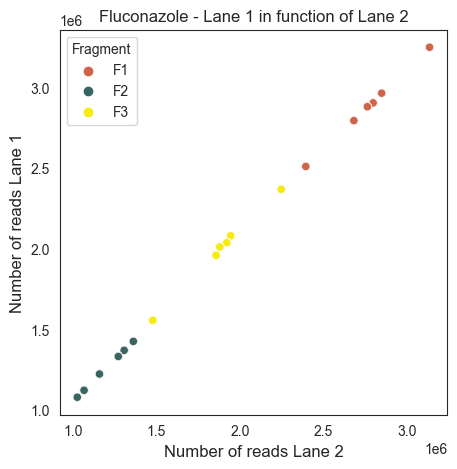

In [11]:
#number of reads after merge
sns.set_style("white")

custom_palette = sns.blend_palette(["#CF6448","#386461","#F6EA0E","#6C44A6"], n_colors=4)
plt.figure(figsize=(5,5))

plt.title(f'{condition} - Lane 1 in function of Lane 2', fontsize=12,y=1)

sns.scatterplot(x=lane2["reads_after_merge"], y=lane1["reads_after_merge"], 
                hue = lane1["Fragment"], legend = True, palette = custom_palette)

#text = "Spearman Coefficient = " + str(round(coeff,2)) + "\nR\u00b2 = " + str(round(R2,2))+ "\np-value = " + str(round(p_value,2))
#plt.text(0.75*1e6, 3*1e6, text , fontsize = 12)

plt.xlabel("Number of reads Lane 2", fontsize=12)
plt.ylabel("Number of reads Lane 1", fontsize =12)

name = "Lane_1_in_function_of_Lane_2_Reads_after_merge_"+ condition + "_" + experiment + "_" + date
plt.savefig(f"c:{name}.png", format='png',  dpi=400)

C:\Users\CABED117\AppData\Local\Temp\ipykernel_24244\1411741858.py:8: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  sns.scatterplot(x=lane2["nbr_reads"], y=lane1["nbr_reads"],


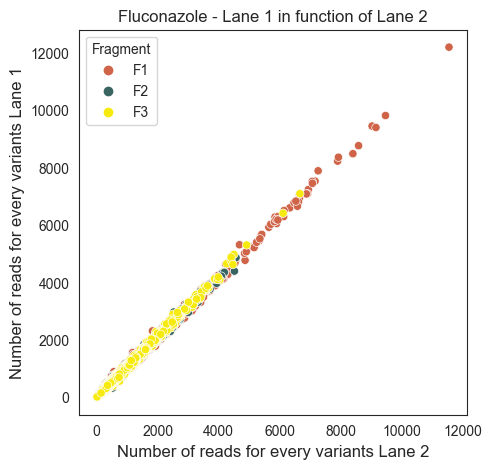

In [12]:
#Frequency of every variant

custom_palette = sns.blend_palette(["#CF6448","#386461","#F6EA0E","#6C44A6"], n_colors=4)
plt.figure(figsize=(5,5))

plt.title(f'{condition} - Lane 1 in function of Lane 2', fontsize=12,y=1)

sns.scatterplot(x=lane2["nbr_reads"], y=lane1["nbr_reads"], 
                hue = lane1["Fragment"], legend = True, palette = custom_palette)

plt.xlabel("Number of reads for every variants Lane 2", fontsize=12)
plt.ylabel("Number of reads for every variants Lane 1", fontsize =12)

name = "Lane_1_in_function_of_Lane_2_Reads_number_" + condition + "_" + experiment + "_" + date
plt.savefig(f"c:{name}.png", format='png',  dpi=400)

In [13]:
#If it looks good we can Sum the lanes

df_group = df.groupby(["Condition","position","codon","Timepoint","Antifungal","Fragment", "Replicate", "OD"])
cols = ["nbr_reads","reads_wanted","reads_before",
        "reads_after_merge","nbr_reads_single", "reads_align","reads_wt"]
df_sum = df_group[cols].sum()

#reset index so the index becomes columns again
df_sum = df_sum.reset_index(level=["Condition","position","codon",
                                   "Timepoint","Antifungal","Fragment", "Replicate","OD"])

df_sum

,Condition,position,codon,Timepoint,Antifungal,Fragment,Replicate,OD,nbr_reads,reads_wanted,reads_before,reads_after_merge,nbr_reads_single,reads_align,reads_wt
0,CaERG11_0_Fluco_F1_1,55,AAA,0,Fluco,F1,1,8.150000,728.0,7000000,5931611,5703603,1368842,5662797,687048
1,CaERG11_0_Fluco_F1_1,55,AAC,0,Fluco,F1,1,8.150000,653.0,7000000,5931611,5703603,1368842,5662797,687048
2,CaERG11_0_Fluco_F1_1,55,AAG,0,Fluco,F1,1,8.150000,885.0,7000000,5931611,5703603,1368842,5662797,687048
3,CaERG11_0_Fluco_F1_1,55,AAT,0,Fluco,F1,1,8.150000,548.0,7000000,5931611,5703603,1368842,5662797,687048
4,CaERG11_0_Fluco_F1_1,55,ACC,0,Fluco,F1,1,8.150000,460.0,7000000,5931611,5703603,1368842,5662797,687048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48853,CaERG11_2_Fluco_F4_3,511,TGT,2,Fluco,F4,3,7.798862,277.0,5000000,3519462,3509659,706372,3472293,332442
48854,CaERG11_2_Fluco_F4_3,511,TTA,2,Fluco,F4,3,7.798862,167.0,5000000,3519462,3509659,706372,3472293,332442
48855,CaERG11_2_Fluco_F4_3,511,TTC,2,Fluco,F4,3,7.798862,1416.0,5000000,3519462,3509659,706372,3472293,332442
48856,CaERG11_2_Fluco_F4_3,511,TTG,2,Fluco,F4,3,7.798862,236.0,5000000,3519462,3509659,706372,3472293,332442


C:\Users\CABED117\Anaconda3\lib\site-packages\seaborn\categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


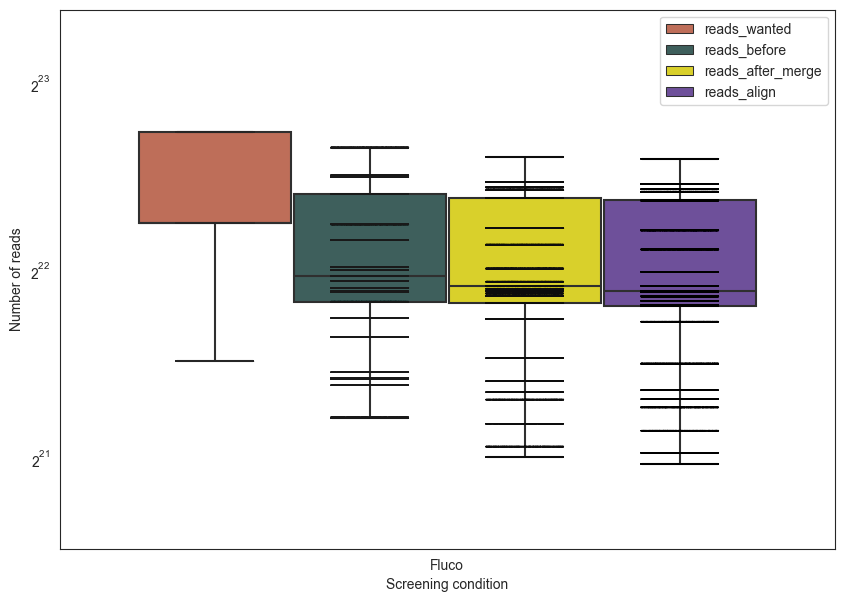

In [14]:
df_melt = pd.melt(df_sum, id_vars=['Antifungal'],value_vars=['reads_wanted', "reads_before",'reads_after_merge',"reads_align"], var_name='Reads control', value_name='Reads')

plt.figure(figsize=(10, 7))
custom_palette = sns.blend_palette(["#CF6448","#386461","#F6EA0E","#6C44A6"], n_colors=4)

ax = sns.boxplot(data=df_melt, x="Antifungal", y="Reads", hue = "Reads control",palette = custom_palette)
ax = sns.stripplot(data=df_melt, x="Antifungal", y="Reads", hue = "Reads control",color="black",dodge=True, jitter=0.2, size=1)

plt.ylim(1500000, 11000000)

plt.yscale('log', base=2)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:4], labels[:4])

plt.xlabel('Screening condition')
plt.ylabel('Number of reads')

plt.show()

In [15]:
#Get the codons in the wt seq

wt_dict = {}
pos = 1

for i in range(0, len(Ca_ERG11), 3):
    codon = Ca_ERG11[i:i + 3]
    wt_dict.update({pos : codon})
    pos = pos+1

In [16]:
# remove wt, they have a count of 0 as they are not variants

ite = 0

for i in df_sum.iterrows() :
    
    first_row = df_sum.loc[ite]
    
    position = first_row['position']
    codon_wt = wt_dict[position]
    
    if first_row['codon'] == codon_wt :

        df_sum = df_sum.drop(ite)
        
    ite = ite+1   
    
df_sum = df_sum.reset_index()
df_sum

,index,Condition,position,codon,Timepoint,Antifungal,Fragment,Replicate,OD,nbr_reads,reads_wanted,reads_before,reads_after_merge,nbr_reads_single,reads_align,reads_wt
0,0,CaERG11_0_Fluco_F1_1,55,AAA,0,Fluco,F1,1,8.150000,728.0,7000000,5931611,5703603,1368842,5662797,687048
1,1,CaERG11_0_Fluco_F1_1,55,AAC,0,Fluco,F1,1,8.150000,653.0,7000000,5931611,5703603,1368842,5662797,687048
2,2,CaERG11_0_Fluco_F1_1,55,AAG,0,Fluco,F1,1,8.150000,885.0,7000000,5931611,5703603,1368842,5662797,687048
3,3,CaERG11_0_Fluco_F1_1,55,AAT,0,Fluco,F1,1,8.150000,548.0,7000000,5931611,5703603,1368842,5662797,687048
4,4,CaERG11_0_Fluco_F1_1,55,ACC,0,Fluco,F1,1,8.150000,460.0,7000000,5931611,5703603,1368842,5662797,687048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47947,48853,CaERG11_2_Fluco_F4_3,511,TGT,2,Fluco,F4,3,7.798862,277.0,5000000,3519462,3509659,706372,3472293,332442
47948,48854,CaERG11_2_Fluco_F4_3,511,TTA,2,Fluco,F4,3,7.798862,167.0,5000000,3519462,3509659,706372,3472293,332442
47949,48855,CaERG11_2_Fluco_F4_3,511,TTC,2,Fluco,F4,3,7.798862,1416.0,5000000,3519462,3509659,706372,3472293,332442
47950,48856,CaERG11_2_Fluco_F4_3,511,TTG,2,Fluco,F4,3,7.798862,236.0,5000000,3519462,3509659,706372,3472293,332442


In [17]:
#Now we summed the lanes we can put more info in the df : reads in log and normalized. 
#You have to add +1 to the number of reads if you want to be able to get the log2

df_sum['nbr_reads_log'] = np.log2(df_sum['nbr_reads']+1)
df_sum['norm_reads'] = ((df_sum['nbr_reads']+1) / df_sum['reads_align'])
df_sum['norm_reads_log'] = np.log2(df_sum['norm_reads'])

df_sum=df_sum.reset_index()
df_sum = df_sum.drop("index",axis=1)

name = "Variant_count_Lanes_summed_" + condition + "_" + experiment + "_" + date
df_sum.to_csv(f"c:{name}.csv")  

# 3- Selection coefficient

In [18]:
#open the variants counts with summed lanes

name = "Variant_count_Lanes_summed_" + condition + "_" + experiment + "_" + date + ".csv"
df_v = pd.read_csv(name, header=0, index_col = 0)
df_v

,level_0,Condition,position,codon,Timepoint,Antifungal,Fragment,Replicate,OD,nbr_reads,reads_wanted,reads_before,reads_after_merge,nbr_reads_single,reads_align,reads_wt,nbr_reads_log,norm_reads,norm_reads_log
0,0,CaERG11_0_Fluco_F1_1,55,AAA,0,Fluco,F1,1,8.150000,728.0,7000000,5931611,5703603,1368842,5662797,687048,9.509775,0.000129,-12.923308
1,1,CaERG11_0_Fluco_F1_1,55,AAC,0,Fluco,F1,1,8.150000,653.0,7000000,5931611,5703603,1368842,5662797,687048,9.353147,0.000115,-13.079937
2,2,CaERG11_0_Fluco_F1_1,55,AAG,0,Fluco,F1,1,8.150000,885.0,7000000,5931611,5703603,1368842,5662797,687048,9.791163,0.000156,-12.641920
3,3,CaERG11_0_Fluco_F1_1,55,AAT,0,Fluco,F1,1,8.150000,548.0,7000000,5931611,5703603,1368842,5662797,687048,9.100662,0.000097,-13.332421
4,4,CaERG11_0_Fluco_F1_1,55,ACC,0,Fluco,F1,1,8.150000,460.0,7000000,5931611,5703603,1368842,5662797,687048,8.848623,0.000081,-13.584460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47947,47947,CaERG11_2_Fluco_F4_3,511,TGT,2,Fluco,F4,3,7.798862,277.0,5000000,3519462,3509659,706372,3472293,332442,8.118941,0.000080,-13.608516
47948,47948,CaERG11_2_Fluco_F4_3,511,TTA,2,Fluco,F4,3,7.798862,167.0,5000000,3519462,3509659,706372,3472293,332442,7.392317,0.000048,-14.335140
47949,47949,CaERG11_2_Fluco_F4_3,511,TTC,2,Fluco,F4,3,7.798862,1416.0,5000000,3519462,3509659,706372,3472293,332442,10.468624,0.000408,-11.258833
47950,47950,CaERG11_2_Fluco_F4_3,511,TTG,2,Fluco,F4,3,7.798862,236.0,5000000,3519462,3509659,706372,3472293,332442,7.888743,0.000068,-13.838714


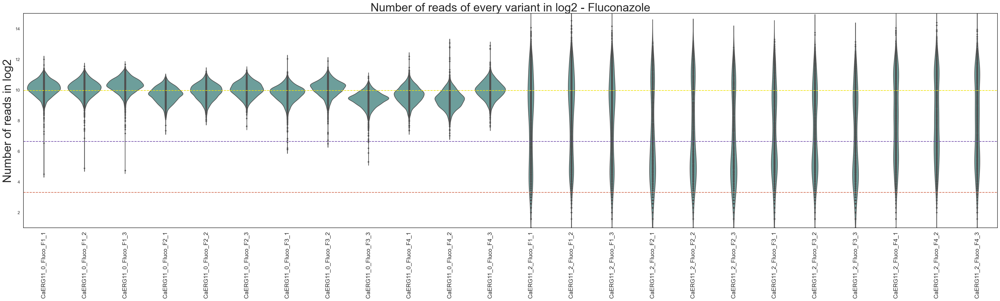

In [19]:

sns.set_style("white")

row = 0
sns.set_theme(style="white", palette=None)
plt.figure(figsize=(45,10))

sns.violinplot(data = df_v, x = 'Condition', y = 'nbr_reads_log',   inner = "point",width=1, color = "#65A6A2")
plt.ylabel("Number of reads in log2",fontsize = 30)
plt.xlabel("")
plt.tick_params(axis="x", labelsize=15, rotation = 90) 
title = condition
plt.title(title, fontsize = 40)
plt.axhline(9.97, color="#EEE304", linestyle="--")
plt.axhline(6.64, color = "#6C44A6", linestyle="--")
plt.axhline(3.32, color = "#D06448", linestyle="--")
plt.ylim(1, 15)


plt.title(f'Number of reads of every variant in log2 - {condition}',y=1, fontsize=30)

name = "./violin_plot_reads_all_log2_lanes_summed_" + condition + "_" + experiment + "_" + date + ".csv"
plt.savefig(f'{name}.png', transparent=True, dpi=400, bbox_inches='tight')

In [20]:
#Get a wide format with reads at every timepoint

#reads norm not in log
df_wide_tp = pd.pivot_table(df_v, index=["position","codon","Antifungal","Fragment", "Replicate"], 
                            columns= "Timepoint", values="norm_reads")

colus = df_sum['Timepoint'].unique()
df_wide_tp=df_wide_tp[colus]

df_wide_tp = df_wide_tp.reset_index(level=["position","codon","Replicate","Antifungal","Fragment"])
df_wide_tp = df_wide_tp.rename(columns={0: 'freq_tp0', 1 : "freq_tp1",
                                        2 : "freq_tp2", 3 : "freq_tp3"}) #remove 3 if no tp3

df_wide_tp

Timepoint,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2
0,55,AAA,Fluco,F1,1,0.000129,0.000011
1,55,AAA,Fluco,F1,2,0.000135,0.000010
2,55,AAA,Fluco,F1,3,0.000193,0.000012
3,55,AAC,Fluco,F1,1,0.000115,0.000008
4,55,AAC,Fluco,F1,2,0.000112,0.000012
...,...,...,...,...,...,...,...
23971,511,TTG,Fluco,F4,2,0.000149,0.000048
23972,511,TTG,Fluco,F4,3,0.000182,0.000068
23973,511,TTT,Fluco,F4,1,0.000147,0.000477
23974,511,TTT,Fluco,F4,2,0.000108,0.000452


In [21]:
#df wide with raw nbr reads
df_wide_tpnbr = pd.pivot_table(df_v, index=["position","codon","Antifungal","Fragment", "Replicate"],
                               columns= "Timepoint", values="nbr_reads")

colus = df_sum['Timepoint'].unique()
df_wide_tpnbr=df_wide_tpnbr[colus]

df_wide_tpnbr = df_wide_tpnbr.reset_index(level=["position","codon","Replicate","Antifungal","Fragment"])
df_wide_tpnbr = df_wide_tpnbr.rename(columns={0: 'nbr_tp0', 1 : "nbr_tp1",
                                              2 : "nbr_tp2", 3 : "nbr_tp3"}) #remove 3 if no tp3
df_wide_tpnbr

Timepoint,position,codon,Antifungal,Fragment,Replicate,nbr_tp0,nbr_tp2
0,55,AAA,Fluco,F1,1,728.0,58.0
1,55,AAA,Fluco,F1,2,777.0,64.0
2,55,AAA,Fluco,F1,3,1047.0,57.0
3,55,AAC,Fluco,F1,1,653.0,44.0
4,55,AAC,Fluco,F1,2,647.0,72.0
...,...,...,...,...,...,...,...
23971,511,TTG,Fluco,F4,2,565.0,184.0
23972,511,TTG,Fluco,F4,3,758.0,236.0
23973,511,TTT,Fluco,F4,1,541.0,1763.0
23974,511,TTT,Fluco,F4,2,412.0,1758.0


In [22]:
#df wide with OD
df_wide_tpod = pd.pivot_table(df_v, index=["position","codon","Antifungal","Fragment", "Replicate"],
                               columns= "Timepoint", values="OD")

colus = df_sum['Timepoint'].unique()
df_wide_tpod=df_wide_tpod[colus]

df_wide_tpod = df_wide_tpod.reset_index(level=["position","codon","Replicate","Antifungal","Fragment"])
df_wide_tpod = df_wide_tpod.rename(columns={0: 'OD_tp0', 1 : "OD_tp1",
                                              2 : "OD_tp2", 3 : "OD_tp3"}) #remove 3 if no tp3
df_wide_tpod

Timepoint,position,codon,Antifungal,Fragment,Replicate,OD_tp0,OD_tp2
0,55,AAA,Fluco,F1,1,8.15,8.392317
1,55,AAA,Fluco,F1,2,8.15,7.879706
2,55,AAA,Fluco,F1,3,7.80,8.498091
3,55,AAC,Fluco,F1,1,8.15,8.392317
4,55,AAC,Fluco,F1,2,8.15,7.879706
...,...,...,...,...,...,...,...
23971,511,TTG,Fluco,F4,2,0.00,7.665121
23972,511,TTG,Fluco,F4,3,0.00,7.798862
23973,511,TTT,Fluco,F4,1,0.00,7.277896
23974,511,TTT,Fluco,F4,2,0.00,7.665121


In [23]:
#merge wide with frequencies,raw nbrs of reads and od
merged_df = pd.merge(df_wide_tp, df_wide_tpnbr, on=['position', 'codon', "Antifungal", "Fragment", "Replicate"])

merged_df = pd.merge(merged_df, df_wide_tpod, on=['position', 'codon', "Antifungal", "Fragment", 
                                                    "Replicate"])
merged_df

Timepoint,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2
0,55,AAA,Fluco,F1,1,0.000129,0.000011,728.0,58.0,8.15,8.392317
1,55,AAA,Fluco,F1,2,0.000135,0.000010,777.0,64.0,8.15,7.879706
2,55,AAA,Fluco,F1,3,0.000193,0.000012,1047.0,57.0,7.80,8.498091
3,55,AAC,Fluco,F1,1,0.000115,0.000008,653.0,44.0,8.15,8.392317
4,55,AAC,Fluco,F1,2,0.000112,0.000012,647.0,72.0,8.15,7.879706
...,...,...,...,...,...,...,...,...,...,...,...
23971,511,TTG,Fluco,F4,2,0.000149,0.000048,565.0,184.0,0.00,7.665121
23972,511,TTG,Fluco,F4,3,0.000182,0.000068,758.0,236.0,0.00,7.798862
23973,511,TTT,Fluco,F4,1,0.000147,0.000477,541.0,1763.0,0.00,7.277896
23974,511,TTT,Fluco,F4,2,0.000108,0.000452,412.0,1758.0,0.00,7.665121


In [24]:
#log2foldchange calculation

merged_df['log2(tp2/tp0)'] = np.log2((df_wide_tp["freq_tp2"] / df_wide_tp["freq_tp0"]))

merged_df = merged_df.rename(columns={'log2(tp2/tp0)': 'l2fc_0_2'})

merged_df

Timepoint,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2,l2fc_0_2
0,55,AAA,Fluco,F1,1,0.000129,0.000011,728.0,58.0,8.15,8.392317,-3.613026
1,55,AAA,Fluco,F1,2,0.000135,0.000010,777.0,64.0,8.15,7.879706,-3.716396
2,55,AAA,Fluco,F1,3,0.000193,0.000012,1047.0,57.0,7.80,8.498091,-4.016037
3,55,AAC,Fluco,F1,1,0.000115,0.000008,653.0,44.0,8.15,8.392317,-3.847188
4,55,AAC,Fluco,F1,2,0.000112,0.000012,647.0,72.0,8.15,7.879706,-3.285163
...,...,...,...,...,...,...,...,...,...,...,...,...
23971,511,TTG,Fluco,F4,2,0.000149,0.000048,565.0,184.0,0.00,7.665121,-1.642132
23972,511,TTG,Fluco,F4,3,0.000182,0.000068,758.0,236.0,0.00,7.798862,-1.413206
23973,511,TTT,Fluco,F4,1,0.000147,0.000477,541.0,1763.0,0.00,7.277896,1.697388
23974,511,TTT,Fluco,F4,2,0.000108,0.000452,412.0,1758.0,0.00,7.665121,2.061687


In [25]:
#add the corresponding aa to a list using the dictionary we define at the beginning and add to the df

aa_list = []

for _, row in merged_df.iterrows():
    codon = row['codon']
    aa = DNA_Codons.get(codon)
    aa_list.append(aa)
    
merged_df["aa"] = aa_list
merged_df

Timepoint,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2,l2fc_0_2,aa
0,55,AAA,Fluco,F1,1,0.000129,0.000011,728.0,58.0,8.15,8.392317,-3.613026,K
1,55,AAA,Fluco,F1,2,0.000135,0.000010,777.0,64.0,8.15,7.879706,-3.716396,K
2,55,AAA,Fluco,F1,3,0.000193,0.000012,1047.0,57.0,7.80,8.498091,-4.016037,K
3,55,AAC,Fluco,F1,1,0.000115,0.000008,653.0,44.0,8.15,8.392317,-3.847188,N
4,55,AAC,Fluco,F1,2,0.000112,0.000012,647.0,72.0,8.15,7.879706,-3.285163,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...
23971,511,TTG,Fluco,F4,2,0.000149,0.000048,565.0,184.0,0.00,7.665121,-1.642132,L
23972,511,TTG,Fluco,F4,3,0.000182,0.000068,758.0,236.0,0.00,7.798862,-1.413206,L
23973,511,TTT,Fluco,F4,1,0.000147,0.000477,541.0,1763.0,0.00,7.277896,1.697388,F
23974,511,TTT,Fluco,F4,2,0.000108,0.000452,412.0,1758.0,0.00,7.665121,2.061687,F


In [26]:
#Get the codons in the wt seq

wt_dict = {}
pos = 1

for i in range(0, len(Ca_ERG11), 3):
    codon = Ca_ERG11[i:i + 3]
    wt_dict.update({pos : codon})
    pos = pos+1

In [27]:
#open df with wt positions

WT_annot = pd.read_excel('../wt_aa_annot.xlsx', header=0)

aa_wt1 = pd.melt(WT_annot, id_vars=['aa'])

#keep only WT rows

aa_wt1 = aa_wt1[aa_wt1['value'] == 'o'].reset_index(drop=True)

#make a dictionnary of position + wt aa

aa_dict = dict(zip(aa_wt1['variable'], aa_wt1['aa']))

In [28]:
aa_dict

{55: 'I',
 57: 'W',
 58: 'F',
 59: 'G',
 60: 'S',
 61: 'A',
 62: 'A',
 63: 'S',
 64: 'Y',
 65: 'G',
 66: 'Q',
 67: 'Q',
 68: 'P',
 69: 'Y',
 71: 'F',
 72: 'F',
 85: 'F',
 86: 'M',
 87: 'L',
 88: 'L',
 89: 'G',
 90: 'K',
 94: 'V',
 100: 'G',
 101: 'H',
 102: 'E',
 103: 'F',
 104: 'V',
 105: 'F',
 106: 'N',
 107: 'A',
 109: 'L',
 112: 'V',
 113: 'S',
 114: 'A',
 115: 'E',
 116: 'D',
 117: 'A',
 118: 'Y',
 119: 'K',
 120: 'H',
 121: 'L',
 122: 'T',
 123: 'T',
 124: 'P',
 125: 'V',
 126: 'F',
 127: 'G',
 128: 'K',
 129: 'G',
 130: 'V',
 131: 'I',
 132: 'Y',
 133: 'D',
 134: 'C',
 135: 'P',
 136: 'N',
 137: 'S',
 138: 'R',
 139: 'L',
 140: 'M',
 141: 'E',
 142: 'Q',
 143: 'K',
 144: 'K',
 145: 'F',
 146: 'A',
 147: 'K',
 148: 'F',
 149: 'A',
 150: 'L',
 151: 'T',
 154: 'S',
 155: 'F',
 158: 'Y',
 162: 'I',
 192: 'Q',
 195: 'I',
 196: 'T',
 197: 'I',
 199: 'T',
 200: 'A',
 201: 'S',
 202: 'R',
 203: 'S',
 204: 'L',
 205: 'F',
 224: 'L',
 225: 'D',
 226: 'K',
 227: 'G',
 229: 'T',
 230: 'P',


In [29]:
# get all the wts infos in our df

df_wt = merged_df  # Assigning merged_df to df_wt

ite = 0  # Initializing a counter variable

for i in df_wt.iterrows():  # Iterating over the rows of df_wt
    
    first_row = df_wt.loc[ite]  # Accessing the row at index ite
    
    position = first_row['position']  # Extracting the value of 'position' column
    aa_wt = aa_dict[position]  # Getting the corresponding value from wt_dict
    
    if first_row['aa'] != aa_wt:  # Comparing 'codon' value with codon_wt
        
        df_wt = df_wt.drop(ite)  # Dropping the row at index ite
        
    ite = ite + 1  # Incrementing the counter variable
    
df_wt = df_wt.reset_index()
df_wt  # Outputting the filtered DataFrame

Timepoint,index,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2,l2fc_0_2,aa
0,21,55,ATC,Fluco,F1,1,0.000096,0.000073,542.0,410.0,8.15,8.392317,-0.387708,I
1,22,55,ATC,Fluco,F1,2,0.000103,0.000102,591.0,645.0,8.15,7.879706,-0.009201,I
2,23,55,ATC,Fluco,F1,3,0.000150,0.000082,812.0,397.0,7.80,8.498091,-0.871082,I
3,27,55,ATT,Fluco,F1,1,0.000134,0.000101,760.0,564.0,8.15,8.392317,-0.415540,I
4,28,55,ATT,Fluco,F1,2,0.000162,0.000131,932.0,828.0,8.15,7.879706,-0.305642,I
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
799,23965,511,TTA,Fluco,F4,2,0.000105,0.000053,399.0,207.0,0.00,7.665121,-0.972272,L
800,23966,511,TTA,Fluco,F4,3,0.000165,0.000048,688.0,167.0,0.00,7.798862,-1.770036,L
801,23970,511,TTG,Fluco,F4,1,0.000193,0.000054,710.0,200.0,0.00,7.277896,-1.827752,L
802,23971,511,TTG,Fluco,F4,2,0.000149,0.000048,565.0,184.0,0.00,7.665121,-1.642132,L


In [30]:
# get all the synonymous wts infos, they are the most representative of wt behaviour as they are in frequencies similar
# to other variants in comparison with wt that is in higher frequency and correspond only to one measure

df_wt_syn = df_wt

ite = 0

for i in df_wt_syn.iterrows() :
    
    first_row = df_wt_syn.loc[ite]
    
    position = first_row['position']
    nbr_reads = first_row["nbr_tp0"]
    aa_wt = aa_dict[position]
    codon_wt = wt_dict[position]
    
    if first_row['codon'] == codon_wt :

        df_wt_syn = df_wt_syn.drop(ite)
        print("remove : " + str(position) + codon_wt + " = " + str(nbr_reads))
        
    ite = ite+1   
    
df_wt_syn = df_wt_syn.reset_index().drop("index",axis=1).drop("level_0",axis=1)
df_wt_syn

Timepoint,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2,l2fc_0_2,aa
0,55,ATC,Fluco,F1,1,0.000096,0.000073,542.0,410.0,8.15,8.392317,-0.387708,I
1,55,ATC,Fluco,F1,2,0.000103,0.000102,591.0,645.0,8.15,7.879706,-0.009201,I
2,55,ATC,Fluco,F1,3,0.000150,0.000082,812.0,397.0,7.80,8.498091,-0.871082,I
3,55,ATT,Fluco,F1,1,0.000134,0.000101,760.0,564.0,8.15,8.392317,-0.415540,I
4,55,ATT,Fluco,F1,2,0.000162,0.000131,932.0,828.0,8.15,7.879706,-0.305642,I
...,...,...,...,...,...,...,...,...,...,...,...,...,...
799,511,TTA,Fluco,F4,2,0.000105,0.000053,399.0,207.0,0.00,7.665121,-0.972272,L
800,511,TTA,Fluco,F4,3,0.000165,0.000048,688.0,167.0,0.00,7.798862,-1.770036,L
801,511,TTG,Fluco,F4,1,0.000193,0.000054,710.0,200.0,0.00,7.277896,-1.827752,L
802,511,TTG,Fluco,F4,2,0.000149,0.000048,565.0,184.0,0.00,7.665121,-1.642132,L


In [31]:
#wt for every fragment and replicate

wt_frag = df_wt_syn.groupby("Fragment")
f1_wt = wt_frag.get_group("F1").reset_index()
f2_wt = wt_frag.get_group("F2").reset_index()
f3_wt = wt_frag.get_group("F3").reset_index()
f4_wt = wt_frag.get_group("F4").reset_index()

wt_frag1_r = f1_wt.groupby("Replicate")
f1_wt1 = wt_frag1_r.get_group(1).reset_index()
f1_wt2 = wt_frag1_r.get_group(2).reset_index()
f1_wt3 = wt_frag1_r.get_group(3).reset_index()

wt_frag2_r = f2_wt.groupby("Replicate")
f2_wt1 = wt_frag2_r.get_group(1).reset_index()
f2_wt2 = wt_frag2_r.get_group(2).reset_index()
f2_wt3 = wt_frag2_r.get_group(3).reset_index()

wt_frag3_r = f3_wt.groupby("Replicate")
f3_wt1 = wt_frag3_r.get_group(1).reset_index()
f3_wt2 = wt_frag3_r.get_group(2).reset_index()
f3_wt3 = wt_frag3_r.get_group(3).reset_index()

wt_frag4_r = f4_wt.groupby("Replicate")
f4_wt1 = wt_frag4_r.get_group(1).reset_index()
f4_wt2 = wt_frag4_r.get_group(2).reset_index()
f4_wt3 = wt_frag4_r.get_group(3).reset_index()

merged_df["select_coef"] = np.nan #add an empty column to add our selection coefficient
merged_df_frag = merged_df.groupby("Fragment")

m1 = merged_df_frag.get_group("F1")
m1r = m1.groupby("Replicate")
m1_1 = m1r.get_group(1).reset_index()
m1_2 = m1r.get_group(2).reset_index()
m1_3 = m1r.get_group(3).reset_index()

m2 = merged_df_frag.get_group("F2")
m2r = m2.groupby("Replicate")
m2_1 = m2r.get_group(1).reset_index()
m2_2 = m2r.get_group(2).reset_index()
m2_3 = m2r.get_group(3).reset_index()

m3 = merged_df_frag.get_group("F3")
m3r = m3.groupby("Replicate")
m3_1 = m3r.get_group(1).reset_index()
m3_2 = m3r.get_group(2).reset_index()
m3_3 = m3r.get_group(3).reset_index()

m4 = merged_df_frag.get_group("F4")
m4r = m4.groupby("Replicate")
m4_1 = m4r.get_group(1).reset_index()
m4_2 = m4r.get_group(2).reset_index()
m4_3 = m4r.get_group(3).reset_index()

In [32]:
rep_list = [1,2,3]

ite=0
nbr_gen_list = []
select_coef_list = []
df_list = []

for r in rep_list :
        
    name = "m1_" + str(r)
    df = globals()[name]
    wt_name = "f1_wt" + str(r)
    df_wt = globals()[wt_name]
    df = df.reset_index()
    
    for i in range(len(df)) :
        
        first_row = df.loc[i]
            
        nbr_gen = first_row["OD_tp2"]  
        
        freq_mut_2 = first_row["freq_tp2"]
        freq_mut_0 = first_row["freq_tp0"]
        
        med_freq_wt_2 = df_wt["freq_tp2"].median()
        med_freq_wt_0 = df_wt["freq_tp0"].median()
            
        select_coef = np.log2((freq_mut_2 * med_freq_wt_0)/(freq_mut_0 * med_freq_wt_2))/nbr_gen
        
        nbr_gen_list.append(float(nbr_gen)) 
        select_coef_list.append(float(select_coef))

    print(med_freq_wt_2)   
    print(med_freq_wt_0)
    df['nbr_gen'] = nbr_gen_list
    df['select_coef'] = select_coef_list
    df_list.append(df)
    
    nbr_gen_list = []
    select_coef_list = []

concatenated_df1 = pd.concat(df_list, axis=0)

concatenated_df1 

0.0001667350250548
0.00021358703128505002
0.0001873498185403
0.0002063532556447
0.0001989423583013
0.00024713949377435003


Timepoint,level_0,index,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2,l2fc_0_2,aa,select_coef,nbr_gen
0,0,0,55,AAA,Fluco,F1,1,0.000129,0.000011,728.0,58.0,8.15,8.392317,-3.613026,K,-0.387945,8.392317
1,1,3,55,AAC,Fluco,F1,1,0.000115,0.000008,653.0,44.0,8.15,8.392317,-3.847188,N,-0.415847,8.392317
2,2,6,55,AAG,Fluco,F1,1,0.000156,0.000003,885.0,18.0,8.15,8.392317,-5.529130,K,-0.616262,8.392317
3,3,9,55,AAT,Fluco,F1,1,0.000097,0.000004,548.0,23.0,8.15,8.392317,-4.501594,N,-0.493824,8.392317
4,4,12,55,ACC,Fluco,F1,1,0.000081,0.000047,460.0,260.0,8.15,8.392317,-0.806611,T,-0.053542,8.392317
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2832,2832,8930,162,TGT,Fluco,F1,3,0.000167,0.000057,907.0,275.0,7.80,8.498091,-1.558619,C,-0.146579,8.498091
2833,2833,8936,162,TTA,Fluco,F1,3,0.000239,0.000054,1299.0,263.0,7.80,8.498091,-2.140497,L,-0.215051,8.498091
2834,2834,8942,162,TTC,Fluco,F1,3,0.000241,0.000028,1306.0,134.0,7.80,8.498091,-3.115823,F,-0.329821,8.498091
2835,2835,8948,162,TTG,Fluco,F1,3,0.000220,0.000043,1195.0,209.0,7.80,8.498091,-2.350351,L,-0.239745,8.498091


In [33]:
rep_list = [1,2,3]

ite=0
nbr_gen_list = []
select_coef_list = []
df_list = []

for r in rep_list :
        
    name = "m2_" + str(r)
    df = globals()[name]
    wt_name = "f2_wt" + str(r)
    df_wt = globals()[wt_name]
    df = df.reset_index()
    
    for i in range(len(df)) :
        
        first_row = df.loc[i]
            
        nbr_gen = first_row["OD_tp2"] 
        
        freq_mut_2 = first_row["freq_tp2"]
        freq_mut_0 = first_row["freq_tp0"]
        
        med_freq_wt_2 = df_wt["freq_tp2"].median()
        med_freq_wt_0 = df_wt["freq_tp0"].median()
            
        select_coef = np.log2((freq_mut_2 * med_freq_wt_0)/(freq_mut_0 * med_freq_wt_2))/nbr_gen
        
        nbr_gen_list.append(float(nbr_gen)) 
        select_coef_list.append(float(select_coef))

    print(med_freq_wt_2)   
    df['nbr_gen'] = nbr_gen_list
    df['select_coef'] = select_coef_list
    df_list.append(df)
    
    nbr_gen_list = []
    select_coef_list = []

concatenated_df2 = pd.concat(df_list, axis=0)

concatenated_df2 

0.00059149325159965
0.00057005733953455
0.00047095220244480003


Timepoint,level_0,index,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2,l2fc_0_2,aa,select_coef,nbr_gen
0,0,8067,154,AAA,Fluco,F2,1,0.000289,0.001792,592.0,3831.0,7.43,7.503349,2.632460,K,0.286466,7.503349
1,1,8073,154,AAC,Fluco,F2,1,0.000312,0.000115,640.0,244.0,7.43,7.503349,-1.447076,N,-0.257229,7.503349
2,2,8079,154,AAG,Fluco,F2,1,0.000344,0.002056,704.0,4397.0,7.43,7.503349,2.581619,K,0.279690,7.503349
3,3,8085,154,AAT,Fluco,F2,1,0.000200,0.000050,409.0,107.0,7.43,7.503349,-1.984126,N,-0.328804,7.503349
4,4,8091,154,ACC,Fluco,F2,1,0.000331,0.000076,678.0,161.0,7.43,7.503349,-2.126952,T,-0.347839,7.503349
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1151,1151,12287,280,TGT,Fluco,F2,3,0.000440,0.000017,1113.0,39.0,6.90,8.155830,-4.675651,C,-0.601846,8.155830
1152,1152,12293,280,TTA,Fluco,F2,3,0.000240,0.000275,605.0,637.0,6.90,8.155830,0.198193,L,-0.004256,8.155830
1153,1153,12299,280,TTC,Fluco,F2,3,0.000287,0.000023,726.0,52.0,6.90,8.155830,-3.653936,F,-0.476572,8.155830
1154,1154,12305,280,TTG,Fluco,F2,3,0.000267,0.000413,673.0,957.0,6.90,8.155830,0.631232,L,0.048840,8.155830


In [34]:
rep_list = [1,2,3]

ite=0
nbr_gen_list = []
select_coef_list = []
df_list = []

for r in rep_list :
        
    name = "m3_" + str(r)
    df = globals()[name]
    wt_name = "f3_wt" + str(r)
    df_wt = globals()[wt_name]
    df = df.reset_index()
    
    for i in range(len(df)) :
        
        first_row = df.loc[i]
            
        nbr_gen = first_row["OD_tp2"] 
        
        freq_mut_2 = first_row["freq_tp2"]
        freq_mut_0 = first_row["freq_tp0"]
        
        med_freq_wt_2 = df_wt["freq_tp2"].median()
        med_freq_wt_0 = df_wt["freq_tp0"].median()
            
        select_coef = np.log2((freq_mut_2 * med_freq_wt_0)/(freq_mut_0 * med_freq_wt_2))/nbr_gen
        
        nbr_gen_list.append(float(nbr_gen)) 
        select_coef_list.append(float(select_coef))

    print(med_freq_wt_2)   
    df['nbr_gen'] = nbr_gen_list
    df['select_coef'] = select_coef_list
    df_list.append(df)
    
    nbr_gen_list = []
    select_coef_list = []

concatenated_df3 = pd.concat(df_list, axis=0)

concatenated_df3 

0.00026197736021165
0.0003116338573274
0.0002565209568179


Timepoint,level_0,index,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2,l2fc_0_2,aa,select_coef,nbr_gen
0,0,11646,276,AAA,Fluco,F3,1,0.000196,0.000451,734.0,1788.0,7.42,8.384050,1.203845,K,0.140972,8.384050
1,1,11652,276,AAC,Fluco,F3,1,0.000157,0.000581,588.0,2302.0,7.42,8.384050,1.887683,N,0.222536,8.384050
2,2,11658,276,AAG,Fluco,F3,1,0.000228,0.000528,853.0,2093.0,7.42,8.384050,1.214462,K,0.142238,8.384050
3,3,11664,276,AAT,Fluco,F3,1,0.000257,0.000966,965.0,3830.0,7.42,8.384050,1.908134,N,0.224975,8.384050
4,4,11670,276,ACC,Fluco,F3,1,0.000220,0.000869,826.0,3444.0,7.42,8.384050,1.979053,T,0.233434,8.384050
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014,2014,18680,406,TGT,Fluco,F3,3,0.000190,0.000215,565.0,817.0,7.05,8.336283,0.172701,C,0.005733,8.336283
2015,2015,18686,406,TTA,Fluco,F3,3,0.000293,0.000855,869.0,3259.0,7.05,8.336283,1.547187,L,0.170613,8.336283
2016,2016,18692,406,TTC,Fluco,F3,3,0.000164,0.000565,487.0,2154.0,7.05,8.336283,1.784137,F,0.199036,8.336283
2017,2017,18698,406,TTG,Fluco,F3,3,0.000291,0.000576,865.0,2196.0,7.05,8.336283,0.984498,L,0.103114,8.336283


In [35]:
rep_list = [1,2,3]

ite=0
nbr_gen_list = []
select_coef_list = []
df_list = []

for r in rep_list :
        
    name = "m4_" + str(r)
    df = globals()[name]
    wt_name = "f4_wt" + str(r)
    df_wt = globals()[wt_name]
    df = df.reset_index()
    df_wt = df_wt.drop("level_0",axis=1).reset_index()
    
    for i in range(len(df)) :
        
        first_row = df.loc[i]
            
        nbr_gen = first_row["OD_tp2"] 
        
        freq_mut_2 = first_row["freq_tp2"]
        freq_mut_0 = first_row["freq_tp0"]
        
        med_freq_wt_2 = df_wt["freq_tp2"].median()

        med_freq_wt_0 = df_wt["freq_tp0"].median()
            
        select_coef = np.log2((freq_mut_2 * med_freq_wt_0)/(freq_mut_0 * med_freq_wt_2))/nbr_gen
        
        nbr_gen_list.append(float(nbr_gen)) 
        select_coef_list.append(float(select_coef))
        
    print(nbr_gen)
    print(med_freq_wt_0)
    print(med_freq_wt_2)       
    df['nbr_gen'] = nbr_gen_list
    df['select_coef'] = select_coef_list
    df_list.append(df)
    
    nbr_gen_list = []
    select_coef_list = []

concatenated_df4 = pd.concat(df_list, axis=0)

concatenated_df4 

7.27789638276
0.00024225943773544998
0.00010102488187385
7.665121378759992
0.0001836622461787
0.0001015857144253
7.798861898522901
0.00026393022278865
0.00010698981911944999


Timepoint,level_0,index,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2,l2fc_0_2,aa,select_coef,nbr_gen
0,0,17367,401,AAA,Fluco,F4,1,0.000157,0.000010,576.0,35.0,0.0,7.277896,-4.007601,K,-0.377274,7.277896
1,1,17373,401,AAC,Fluco,F4,1,0.000347,0.000035,1278.0,127.0,0.0,7.277896,-3.325899,N,-0.283606,7.277896
2,2,17379,401,AAG,Fluco,F4,1,0.000224,0.000006,825.0,23.0,0.0,7.277896,-5.110134,K,-0.528764,7.277896
3,3,17385,401,AAT,Fluco,F4,1,0.000198,0.000014,729.0,49.0,0.0,7.277896,-3.872995,N,-0.358778,7.277896
4,4,17391,401,ACC,Fluco,F4,1,0.000221,0.000024,812.0,86.0,0.0,7.277896,-3.229266,T,-0.270329,7.277896
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1975,1975,23963,511,TGT,Fluco,F4,3,0.000230,0.000080,960.0,277.0,0.0,7.798862,-1.523444,C,-0.028307,7.798862
1976,1976,23966,511,TTA,Fluco,F4,3,0.000165,0.000048,688.0,167.0,0.0,7.798862,-1.770036,L,-0.059926,7.798862
1977,1977,23969,511,TTC,Fluco,F4,3,0.000138,0.000408,574.0,1416.0,0.0,7.798862,1.567213,F,0.367989,7.798862
1978,1978,23972,511,TTG,Fluco,F4,3,0.000182,0.000068,758.0,236.0,0.0,7.798862,-1.413206,L,-0.014172,7.798862


In [36]:
###### save the df
F1_2_long = pd.concat([concatenated_df1 ,concatenated_df2 ],axis=0)
F3_4_long = pd.concat([concatenated_df3 , concatenated_df4 ],axis=0)
All_concat = pd.concat([F1_2_long, F3_4_long],axis=0)
name = "Select_coeff_log2foldchange_" + condition + "_" + experiment + "_" + date
All_concat.to_csv(f"c:{name}.csv")  

All_concat

Timepoint,level_0,index,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2,l2fc_0_2,aa,select_coef,nbr_gen
0,0,0,55,AAA,Fluco,F1,1,0.000129,0.000011,728.0,58.0,8.15,8.392317,-3.613026,K,-0.387945,8.392317
1,1,3,55,AAC,Fluco,F1,1,0.000115,0.000008,653.0,44.0,8.15,8.392317,-3.847188,N,-0.415847,8.392317
2,2,6,55,AAG,Fluco,F1,1,0.000156,0.000003,885.0,18.0,8.15,8.392317,-5.529130,K,-0.616262,8.392317
3,3,9,55,AAT,Fluco,F1,1,0.000097,0.000004,548.0,23.0,8.15,8.392317,-4.501594,N,-0.493824,8.392317
4,4,12,55,ACC,Fluco,F1,1,0.000081,0.000047,460.0,260.0,8.15,8.392317,-0.806611,T,-0.053542,8.392317
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1975,1975,23963,511,TGT,Fluco,F4,3,0.000230,0.000080,960.0,277.0,0.00,7.798862,-1.523444,C,-0.028307,7.798862
1976,1976,23966,511,TTA,Fluco,F4,3,0.000165,0.000048,688.0,167.0,0.00,7.798862,-1.770036,L,-0.059926,7.798862
1977,1977,23969,511,TTC,Fluco,F4,3,0.000138,0.000408,574.0,1416.0,0.00,7.798862,1.567213,F,0.367989,7.798862
1978,1978,23972,511,TTG,Fluco,F4,3,0.000182,0.000068,758.0,236.0,0.00,7.798862,-1.413206,L,-0.014172,7.798862


In [37]:
#put rows in overlaps in a new df. I want to see the overlap between F3 and F4 as F4 wasnt done at the same time.

df_new = pd.DataFrame(columns=["index", 'position', 'aa', 'Antifungal', 'Fragment', "l2fc_0_2", "l2fc_0_3", "select_coef", "l2fc_0_2_norm", "l2fc_0_3_norm", "select_coef_norm"])

for _, row in All_concat.iterrows():
    position = row['position']
    fragment = row['Fragment']
    
    if position in f3_f4_over and fragment == "F3":
        row['Fragment'] = "F3_4"
        df_new = df_new.append(row, ignore_index=True)
        
    elif position in f2_f3_over and fragment == "F2":
        row['Fragment'] = "F2_3"
        df_new = df_new.append(row, ignore_index=True)
        
    elif position in f2_f3_over and fragment == "F3":
        row['Fragment'] = "F3_2"
        df_new = df_new.append(row, ignore_index=True)
        
    elif position in f1_f2_over and fragment == "F2":
        row['Fragment'] = "F2_1"
        df_new = df_new.append(row, ignore_index=True)
        
    elif position in over_list:
        df_new = df_new.append(row, ignore_index=True)
        
df_new = df_new.drop("level_0",axis=1).reset_index().drop("index",axis=1)

C:\Users\CABED117\AppData\Local\Temp\ipykernel_24244\3579954277.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new = df_new.append(row, ignore_index=True)
C:\Users\CABED117\AppData\Local\Temp\ipykernel_24244\3579954277.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new = df_new.append(row, ignore_index=True)
C:\Users\CABED117\AppData\Local\Temp\ipykernel_24244\3579954277.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new = df_new.append(row, ignore_index=True)
C:\Users\CABED117\AppData\Local\Temp\ipykernel_24244\3579954277.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new = df_new.append(row, ignore_

In [38]:
df_group = df_new.groupby(["Fragment"])

f1 = df_group.get_group("F1").reset_index()
f2_1 = df_group.get_group("F2_1").reset_index()
f2_3 = df_group.get_group("F2_3").reset_index()
f3_2 = df_group.get_group("F3_2").reset_index()
f3_4 = df_group.get_group("F3_4").reset_index()
f4 = df_group.get_group("F4").reset_index()

(-0.8, 0.6)

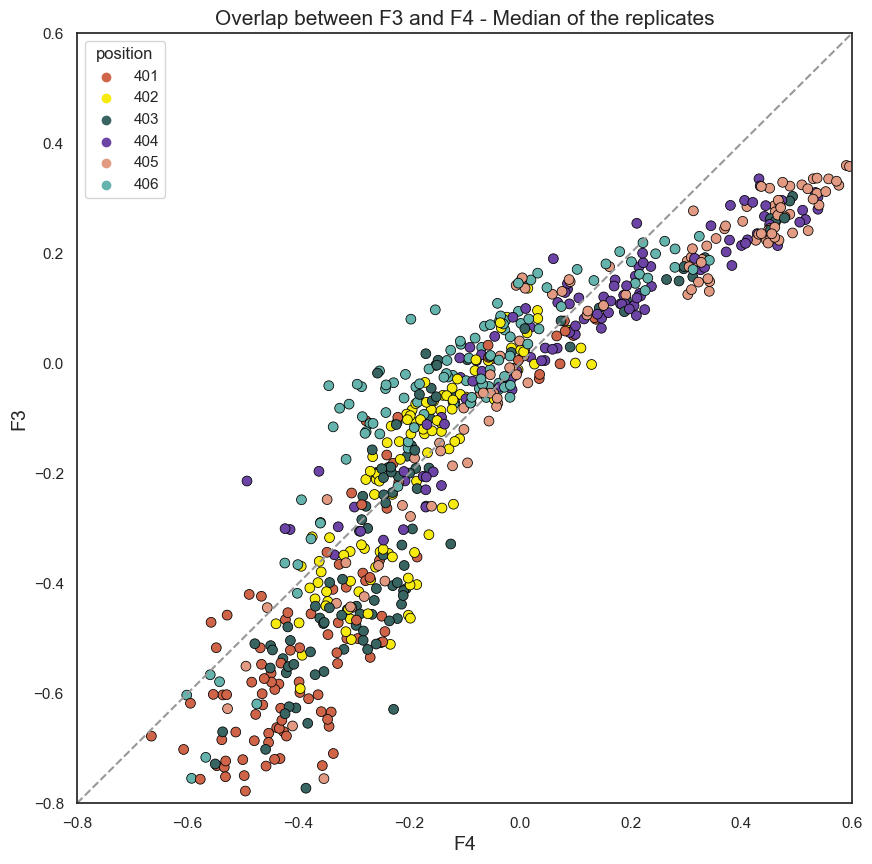

In [39]:
plt.subplots(figsize=(10,10))

custom_palette = sns.color_palette(["#CF6448","#F6EA0E","#386461","#6C44A6","#E29B82","#64B3AC"])
sns.scatterplot(y=f3_4["select_coef"],  x=f4["select_coef"], legend = True, palette = custom_palette,edgecolor="black",  
                    hue = f3_4["position"],s = 50)

x_vals = np.array([-0.8, 0.6])
y_vals = x_vals

plt.xlabel("F4", fontsize=14)
plt.ylabel("F3", fontsize=14)
    
plt.title("Overlap between F3 and F4 - Median of the replicates", fontsize=15)

    # Plot the diagonal line
plt.plot(x_vals, y_vals, '--', color="#989898")

plt.ylim(-0.8, 0.6)
plt.xlim(-0.8, 0.6)

In [40]:
# the overlp between F3 and F4 is not so good, it's because the screening for F4 wasn't done at the same time. 
#I will try to correct this batch effect using a lowess curve + the linear regression we should have 

#code from https://towardsdatascience.com/lowess-regression-in-python-how-to-discover-clear-patterns-in-your-data-f26e523d7a35

import pandas as pd # for data manipulation
import numpy as np # for data manipulation

from sklearn.linear_model import LinearRegression # to build a LR model for comparison
import plotly.graph_objects as go # for data visualization
import plotly.express as px # for data visualization 
import statsmodels.api as sm # to build a LOWESS model
from scipy.interpolate import interp1d # for interpolation of new data points

# ------- Select variables -------
# x values for Linear Regression
X=f4['select_coef'].values.reshape(-1,1) # Note, we need X to be a 2D array, hence reshape
# x values for LOWESS
x=f4['select_coef'].values 
# y values for both
y=f3_4['select_coef'].values

# ------- Linear Regression -------
# Define and fit the model
model1 = LinearRegression()
LR = model1.fit(X, y)

# Predict a few points with Linear Regression model for the grpah
# Create 20 evenly spaced points from smallest X to largest X
x_range = np.linspace(X.min(), X.max(), 20) 
# Predict y values for our set of X values
y_range = model1.predict(x_range.reshape(-1, 1))

# ------- LOWESS -------
# Generate y_hat values using lowess, try a couple values for hyperparameters
lowess = sm.nonparametric.lowess
y_hat1 = lowess(y, x) # note, default frac=2/3
y_hat2 = lowess(y, x, frac=1/5)

# Create a scatter plot
fig = px.scatter(f4, x=f4["select_coef"], y=f3_4["select_coef"], 
                 opacity=0.8, color_discrete_sequence=['black'])

# Add the prediction line
fig.add_traces(go.Scatter(x=x_range, y=y_range, name='Linear Regression', line=dict(color='limegreen')))
fig.add_traces(go.Scatter(x=y_hat1[:,0], y=y_hat1[:,1], name='LOWESS, frac=2/3', line=dict(color='red')))
fig.add_traces(go.Scatter(x=y_hat2[:,0], y=y_hat2[:,1], name='LOWESS, frac=1/5', line=dict(color='orange')))

# Change chart background color
fig.update_layout(dict(plot_bgcolor='white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black',
                 range=[-0.65, 0.65], tickvals=[-0.6, -0.3, 0, 0.3, 0.6])

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black',
                 range=[-0.65, 0.65], tickvals=[-0.6, -0.3, 0, 0.3, 0.6])

# Set figure title and axes labels
fig.update_layout(
    title=dict(
        text="Scatter Plot of the overlap between F3 and F4 - Median of the replicates",
        font=dict(color='black')
    ),
    xaxis=dict(title="F4"),
    yaxis=dict(title="F3")
)

# Set height and width to the same value
fig.update_layout(
    height=500,
    width=700
)

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

In [41]:
#https://www.educative.io/answers/how-to-use-the-scipyinterpolateinterp1d-method?utm_campaign=brand_educative&utm_source=google&utm_medium=ppc&utm_content=performance_max&eid=5082902844932096&utm_term=&utm_campaign=%5BNew%5D+Performance+Max&utm_source=adwords&utm_medium=ppc&hsa_acc=5451446008&hsa_cam=18511913007&hsa_grp=&hsa_ad=&hsa_src=x&hsa_tgt=&hsa_kw=&hsa_mt=&hsa_net=adwords&hsa_ver=3&gclid=CjwKCAjwrranBhAEEiwAzbhNtau_V2fEeiJUrD0Arc-2R027K61S8uMaOLa8QL4sGwMlpc5yzf3xgxoCfW4QAvD_BwE

# ------- Define interploation functions -------
# Linear - draws a line between the two nearest points and calculates value based on the slope of that line
f_linear = interp1d(x=y_hat2[:,0], y=y_hat2[:,1], bounds_error=False, kind='linear', fill_value='extrapolate') 

In [42]:
f4_list = f4["select_coef"].tolist()
ynew_linear = f_linear(f4_list)

f4["ynew_lin"] = ynew_linear

f4

,index,level_0,position,aa,Antifungal,Fragment,l2fc_0_2,l2fc_0_3,select_coef,l2fc_0_2_norm,...,codon,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2,nbr_gen,ynew_lin
0,2238,2238,401,K,Fluco,F4,-4.007601,NaN,-0.377274,NaN,...,AAA,1.0,0.000157,0.000010,576.0,35.0,0.0,7.277896,7.277896,-0.487116
1,2239,2239,401,N,Fluco,F4,-3.325899,NaN,-0.283606,NaN,...,AAC,1.0,0.000347,0.000035,1278.0,127.0,0.0,7.277896,7.277896,-0.348525
2,2240,2240,401,K,Fluco,F4,-5.110134,NaN,-0.528764,NaN,...,AAG,1.0,0.000224,0.000006,825.0,23.0,0.0,7.277896,7.277896,-0.655331
3,2241,2241,401,N,Fluco,F4,-3.872995,NaN,-0.358778,NaN,...,AAT,1.0,0.000198,0.000014,729.0,49.0,0.0,7.277896,7.277896,-0.460538
4,2242,2242,401,T,Fluco,F4,-3.229266,NaN,-0.270329,NaN,...,ACC,1.0,0.000221,0.000024,812.0,86.0,0.0,7.277896,7.277896,-0.316716
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667,2905,2905,406,C,Fluco,F4,-1.598857,NaN,-0.037977,NaN,...,TGT,3.0,0.000239,0.000079,997.0,273.0,0.0,7.798862,7.798862,0.004823
668,2906,2906,406,L,Fluco,F4,-0.495406,NaN,0.103512,NaN,...,TTA,3.0,0.000352,0.000249,1467.0,865.0,0.0,7.798862,7.798862,0.089377
669,2907,2907,406,F,Fluco,F4,0.609706,NaN,0.245214,NaN,...,TTC,3.0,0.000164,0.000250,683.0,867.0,0.0,7.798862,7.798862,0.156265
670,2908,2908,406,L,Fluco,F4,-0.719020,NaN,0.074839,NaN,...,TTG,3.0,0.000321,0.000195,1341.0,677.0,0.0,7.798862,7.798862,0.075753


(-0.9, 0.6)

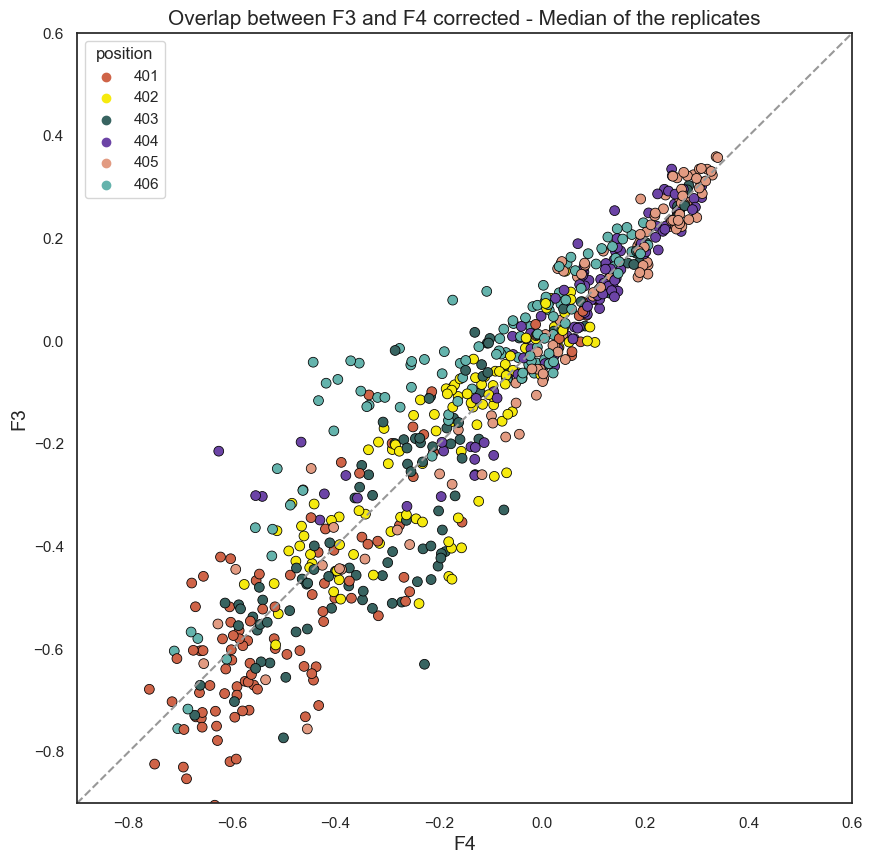

In [43]:
#yay it's way better !! 

plt.subplots(figsize=(10,10))

custom_palette = sns.color_palette(["#CF6448","#F6EA0E","#386461","#6C44A6","#E29B82","#64B3AC"])
sns.scatterplot(y=f3_4["select_coef"],  x=f4["ynew_lin"], legend = True, palette = custom_palette,edgecolor="black",  
                    hue = f3_4["position"],s = 50)

x_vals = np.array([-0.9, 0.6])
y_vals = x_vals

plt.xlabel("F4", fontsize=14)
plt.ylabel("F3", fontsize=14)
    
plt.title("Overlap between F3 and F4 corrected - Median of the replicates", fontsize=15)

    # Plot the diagonal line
plt.plot(x_vals, y_vals, '--', color="#989898")

plt.ylim(-0.9, 0.6)
plt.xlim(-0.9, 0.6)

In [44]:
concatenated_df4 = concatenated_df4.drop("level_0",axis=1).reset_index()
for i in range(len(concatenated_df4)) :
    if concatenated_df4.loc[i,"Fragment"] == "F4" :
        concatenated_df4.loc[i,"select_coef"] = f_linear(concatenated_df4.loc[i,"select_coef"])
        
concatenated_df4

Timepoint,level_0,index,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2,l2fc_0_2,aa,select_coef,nbr_gen
0,0,17367,401,AAA,Fluco,F4,1,0.000157,0.000010,576.0,35.0,0.0,7.277896,-4.007601,K,-0.487116,7.277896
1,1,17373,401,AAC,Fluco,F4,1,0.000347,0.000035,1278.0,127.0,0.0,7.277896,-3.325899,N,-0.348525,7.277896
2,2,17379,401,AAG,Fluco,F4,1,0.000224,0.000006,825.0,23.0,0.0,7.277896,-5.110134,K,-0.655331,7.277896
3,3,17385,401,AAT,Fluco,F4,1,0.000198,0.000014,729.0,49.0,0.0,7.277896,-3.872995,N,-0.460538,7.277896
4,4,17391,401,ACC,Fluco,F4,1,0.000221,0.000024,812.0,86.0,0.0,7.277896,-3.229266,T,-0.316716,7.277896
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5935,1975,23963,511,TGT,Fluco,F4,3,0.000230,0.000080,960.0,277.0,0.0,7.798862,-1.523444,C,0.013148,7.798862
5936,1976,23966,511,TTA,Fluco,F4,3,0.000165,0.000048,688.0,167.0,0.0,7.798862,-1.770036,L,-0.014421,7.798862
5937,1977,23969,511,TTC,Fluco,F4,3,0.000138,0.000408,574.0,1416.0,0.0,7.798862,1.567213,F,0.217522,7.798862
5938,1978,23972,511,TTG,Fluco,F4,3,0.000182,0.000068,758.0,236.0,0.0,7.798862,-1.413206,L,0.024523,7.798862


In [45]:
###### save the df, we will use those data instead
F1_2_long = pd.concat([concatenated_df1 ,concatenated_df2 ],axis=0)
F3_4_long = pd.concat([concatenated_df3 , concatenated_df4 ],axis=0)
All_concat2 = pd.concat([F1_2_long, F3_4_long],axis=0)
name = "Select_coeff_log2foldchange_F4_corrected_" + condition + "_" + experiment + "_" + date
All_concat2.to_csv(f"c:{name}.csv")  

All_concat2

Timepoint,level_0,index,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2,l2fc_0_2,aa,select_coef,nbr_gen
0,0,0,55,AAA,Fluco,F1,1,0.000129,0.000011,728.0,58.0,8.15,8.392317,-3.613026,K,-0.387945,8.392317
1,1,3,55,AAC,Fluco,F1,1,0.000115,0.000008,653.0,44.0,8.15,8.392317,-3.847188,N,-0.415847,8.392317
2,2,6,55,AAG,Fluco,F1,1,0.000156,0.000003,885.0,18.0,8.15,8.392317,-5.529130,K,-0.616262,8.392317
3,3,9,55,AAT,Fluco,F1,1,0.000097,0.000004,548.0,23.0,8.15,8.392317,-4.501594,N,-0.493824,8.392317
4,4,12,55,ACC,Fluco,F1,1,0.000081,0.000047,460.0,260.0,8.15,8.392317,-0.806611,T,-0.053542,8.392317
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5935,1975,23963,511,TGT,Fluco,F4,3,0.000230,0.000080,960.0,277.0,0.00,7.798862,-1.523444,C,0.013148,7.798862
5936,1976,23966,511,TTA,Fluco,F4,3,0.000165,0.000048,688.0,167.0,0.00,7.798862,-1.770036,L,-0.014421,7.798862
5937,1977,23969,511,TTC,Fluco,F4,3,0.000138,0.000408,574.0,1416.0,0.00,7.798862,1.567213,F,0.217522,7.798862
5938,1978,23972,511,TTG,Fluco,F4,3,0.000182,0.000068,758.0,236.0,0.00,7.798862,-1.413206,L,0.024523,7.798862


# 4- Control between replicates

In [46]:
name = "Select_coeff_log2foldchange_F4_corrected_" + condition + "_" + experiment + "_" + date + ".csv"
df_r = pd.read_csv(name, header=0, index_col = 0)
df_r = df_r.drop("level_0",axis=1).drop("index",axis=1)

<Axes:xlabel='Replicate', ylabel='Replicate'>

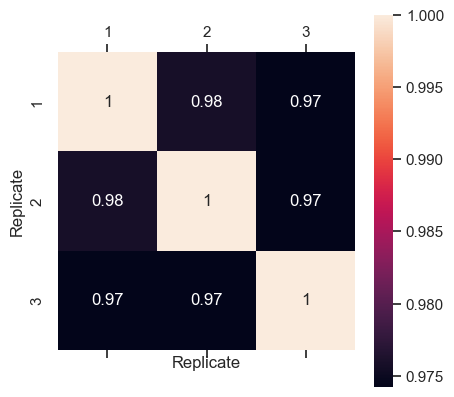

In [47]:
#Correlation condition 1

df_corr = pd.pivot_table(df_r, index=["position","codon","Fragment"], columns= "Replicate", values="select_coef")

colus2 = df_r['Replicate'].unique()
df_corr=df_corr[colus2]

plt.matshow(df_corr.corr())
corr_mat = df_corr.corr()
sns.heatmap(corr_mat, annot=True)

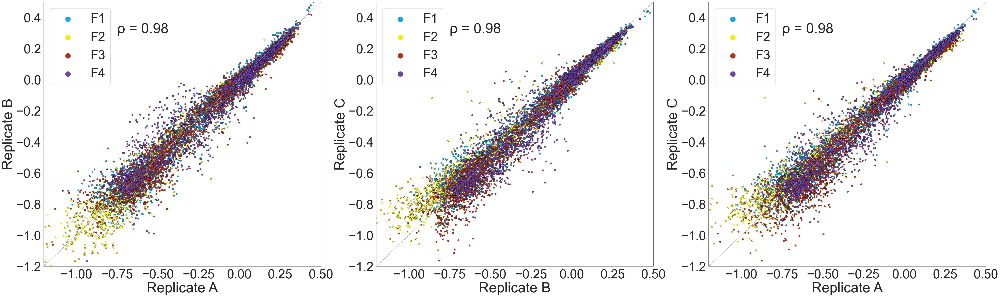

In [48]:
#correlation between replicates

df_r_g = df_r.groupby("Replicate")

r_list = [1,2,1]

r2_list = [2,3,3]
r_lista = ["A","B","A"]

r2_lista = ["B","C","C"]
row = 0
sns.set_theme(style="white")
fig, axes = plt.subplots(1, 3, figsize=(60,17))
axes = axes.flatten()
    
for i in range(3) :
    
    sns.set_theme(style="white")
    
    colors = ["#1DA3DE","#F6EA0E","#B03616","#6C44A6"]
    custom_palette = sns.set_palette(sns.color_palette(colors))
    
    rep1 = df_r_g.get_group(r_list[i]).reset_index()
    rep2 = df_r_g.get_group(r2_list[i]).reset_index()
    
    sns.scatterplot(x=rep1["select_coef"],  y=rep2["select_coef"], legend = True, palette = custom_palette,edgecolor="black",  
                    hue = rep1["Fragment"],ax = axes[row])
    
    axes[row].set_ylabel("Replicate " + str(r2_lista[i]), fontsize=50)
    axes[row].set_xlabel("Replicate " + str(r_lista[i]), fontsize=50)
    
    #title = "Replicate " + str(r_list[i]) + " and Replicate " + str(r2_list[i])
    #axes[row].set_title(title, fontsize=55)
    
    axes[row].set_ylim(-1.2, 0.5)
    axes[row].set_xlim(-1.2, 0.5)
    
    axes[row].tick_params(labelsize = 45)
    
    x_vals = np.array([-1.2, 0.5])
    y_vals = x_vals

    # Plot the diagonal line
    axes[row].plot(x_vals, y_vals, '--', color="#989898")
    
    # Increase the size of the legend
    axes[row].legend(fontsize=45, markerscale=3)
    
    result = sp.stats.spearmanr(rep1["select_coef"],rep2["select_coef"])
    coeff = result[0]
    p_value = "{:.1e}".format(result[1])
    R2 = coeff**2     
    
    text = "ρ = " + str(round(coeff,2))
    #+ "\np-value = "  + str(p_value)
    axes[row].text(-0.75,0.3, text , fontsize = 50)
        
    row +=1
    
fig.subplots_adjust(hspace=0.31)
#fig.suptitle('Correlation between the Selection coefficient of replicates - ' + condition, y=0.95, fontsize=50)

plt.rcParams['svg.fonttype'] = 'none'
name = "Regression_replicate_select_coeff_" + condition + "_" + experiment + "_" + date
plt.savefig(f"c:{name}.png", format='png', transparent=True, dpi=300)
plt.savefig(f"c:{name}.svg", format='svg', transparent=True, dpi=300)

In [49]:
#Get the median of the replicates

df_group = df_r.groupby(["position","codon","Antifungal","Fragment","aa"])
cols = ["freq_tp0","freq_tp2","l2fc_0_2","nbr_tp0","nbr_tp2","nbr_gen","select_coef"]
df_med = df_group[cols].median()

#reset index so the index becomes columns again
df_med = df_med.reset_index(level=["position","codon","Antifungal","Fragment","aa"])

name = "Select_coeff_median_replicates_" + condition + "_" + experiment + "_" + date + ".csv"
df_med.to_csv(name)  
df_med

,position,codon,Antifungal,Fragment,aa,freq_tp0,freq_tp2,l2fc_0_2,nbr_tp0,nbr_tp2,nbr_gen,select_coef
0,55,AAA,Fluco,F1,K,0.000135,0.000011,-3.716396,777.0,58.0,8.392317,-0.435752
1,55,AAC,Fluco,F1,N,0.000115,0.000010,-3.847188,653.0,50.0,8.392317,-0.415847
2,55,AAG,Fluco,F1,K,0.000159,0.000003,-5.529130,917.0,18.0,8.392317,-0.638444
3,55,AAT,Fluco,F1,N,0.000097,0.000006,-3.784753,548.0,39.0,8.392317,-0.462628
4,55,ACC,Fluco,F1,T,0.000081,0.000047,-1.017486,460.0,253.0,8.392317,-0.086046
...,...,...,...,...,...,...,...,...,...,...,...,...
7987,511,TGT,Fluco,F4,C,0.000219,0.000080,-1.156960,804.0,279.0,7.665121,0.013148
7988,511,TTA,Fluco,F4,L,0.000148,0.000053,-1.449444,546.0,200.0,7.665121,0.015239
7989,511,TTC,Fluco,F4,F,0.000126,0.000409,1.693912,465.0,1512.0,7.665121,0.221827
7990,511,TTG,Fluco,F4,L,0.000182,0.000054,-1.642132,710.0,200.0,7.665121,-0.029426


# 5- Control between codons

In [50]:
name = "Select_coeff_median_replicates_" + condition + "_" + experiment + "_" + date + ".csv"
df_c = pd.read_csv(name, header=0, index_col = 0)
df_c

,position,codon,Antifungal,Fragment,aa,freq_tp0,freq_tp2,l2fc_0_2,nbr_tp0,nbr_tp2,nbr_gen,select_coef
0,55,AAA,Fluco,F1,K,0.000135,0.000011,-3.716396,777.0,58.0,8.392317,-0.435752
1,55,AAC,Fluco,F1,N,0.000115,0.000010,-3.847188,653.0,50.0,8.392317,-0.415847
2,55,AAG,Fluco,F1,K,0.000159,0.000003,-5.529130,917.0,18.0,8.392317,-0.638444
3,55,AAT,Fluco,F1,N,0.000097,0.000006,-3.784753,548.0,39.0,8.392317,-0.462628
4,55,ACC,Fluco,F1,T,0.000081,0.000047,-1.017486,460.0,253.0,8.392317,-0.086046
...,...,...,...,...,...,...,...,...,...,...,...,...
7987,511,TGT,Fluco,F4,C,0.000219,0.000080,-1.156960,804.0,279.0,7.665121,0.013148
7988,511,TTA,Fluco,F4,L,0.000148,0.000053,-1.449444,546.0,200.0,7.665121,0.015239
7989,511,TTC,Fluco,F4,F,0.000126,0.000409,1.693912,465.0,1512.0,7.665121,0.221827
7990,511,TTG,Fluco,F4,L,0.000182,0.000054,-1.642132,710.0,200.0,7.665121,-0.029426


In [51]:
#add the corresponding aa to a list using the dictionary we define at the beginning and add to the df

aa_list = []

for _, row in df_c.iterrows():
    codon = row['codon']
    aa = DNA_Codons.get(codon)
    aa_list.append(aa)
    
df_c["aa"] = aa_list

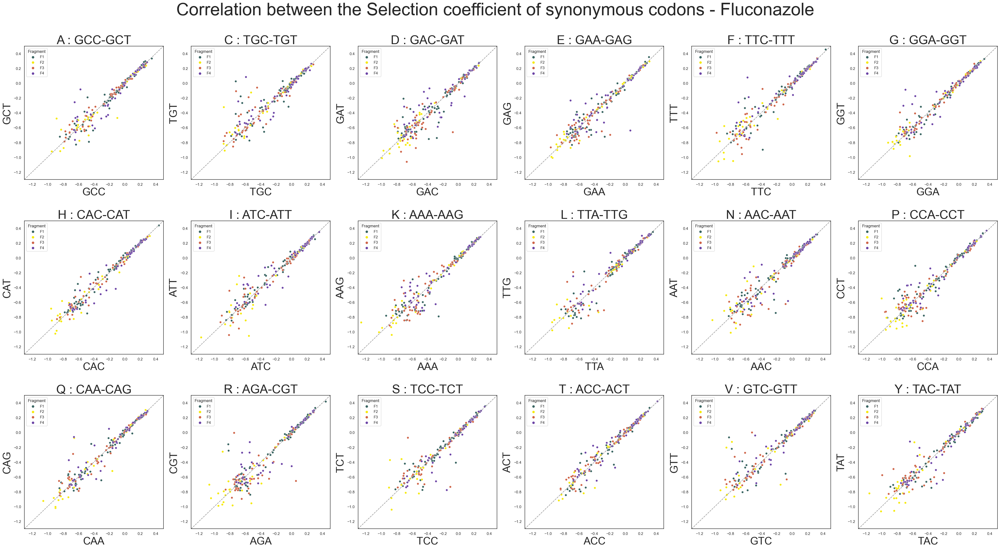

In [52]:
df_co = df_c

# remove wt as they often have only one codon

ite = 0  # Initializing a counter variable

for i in df_co.iterrows():  # Iterating over the rows of df_wt
    
    first_row = df_co.loc[ite]  # Accessing the row at index ite
    
    position = first_row['position']  # Extracting the value of 'position' column
    aa_wt = aa_dict[position]  # Getting the corresponding value from wt_dict
    
    if first_row['aa'] == aa_wt:  # Comparing 'codon' value with codon_wt
        
        df_co = df_co.drop(ite)  # Dropping the row at index ite
        
    ite = ite + 1  # Incrementing the counter variable

df_cod = df_co.groupby(["codon"])
df_aa = df_co.groupby(["aa"])

syn_list = ["A","C","D","E","F","G","H","I","K","L","N","P","Q","R","S","T","V",'Y']

row = 0
sns.set_theme(style="white")
fig, axes = plt.subplots(3, 6, figsize=(50,25))
axes = axes.flatten()
    
for aa in syn_list :
    
    sns.set_theme(style="white")
    
    colors = ["#386461","#F6EA0E","#CF6448","#6C44A6"]
    sns.set_palette(sns.color_palette(colors))
    
    amac = df_aa.get_group(aa)
    
    codons = amac['codon'].unique()
    
    cod1 = codons[0]
    cod2 = codons[1]

    cod_df = amac.groupby("codon")
    
    codon1 = cod_df.get_group(cod1).reset_index()
    codon2 = cod_df.get_group(cod2).reset_index()
    
    sns.scatterplot(x = codon1["select_coef"], y = codon2["select_coef"], legend = True, hue = codon1["Fragment"],ax = axes[row])
    axes[row].set_ylabel(cod2, fontsize=30)
    axes[row].set_xlabel(cod1, fontsize=30)
    title = aa + " : " + cod1 + "-" + cod2
    axes[row].set_title(title, fontsize=35)
    axes[row].set_ylim(-1.3, 0.5)
    axes[row].set_xlim(-1.3, 0.5)
    
    x_vals = np.array([-1.3, 0.5])
    y_vals = x_vals

    # Plot the diagonal line
    axes[row].plot(x_vals, y_vals, '--', color="#989898")

    row +=1
    
fig.subplots_adjust(hspace=0.31)
fig.suptitle('Correlation between the Selection coefficient of synonymous codons - ' + condition, y=0.95, fontsize=50)

name = "Correlation_between_synonymous_codons_" + "select_coeff_" + condition + "_" + experiment + "_" + date 
plt.savefig(f"c:{name}.png", format='png', transparent=True, dpi=400)

In [53]:
# get the mean of every codon

df_group = df_c.groupby(["position","aa","Antifungal","Fragment"])
cols = ["freq_tp0","freq_tp2","l2fc_0_2","nbr_tp0","nbr_tp2","select_coef"]
df_mean = df_group[cols].mean()

#reset index so the index becomes columns again
df_mean = df_mean.reset_index(level=["position","aa","Antifungal","Fragment"])

name = "Selection_coeff_mean_codons_" + condition + "_" + experiment + "_" + date + ".csv"
df_mean.to_csv(name)  

# 6- Control between overlaps

#### We want to verify if the correlation between our overlap is good to see if our results are reproducible and constant.

In [54]:
name = "Selection_coeff_mean_codons_" + condition + "_" + experiment + "_" + date + ".csv"
df_o = pd.read_csv(name, header=0, index_col = 0)

In [55]:
df_o

,position,aa,Antifungal,Fragment,freq_tp0,freq_tp2,l2fc_0_2,nbr_tp0,nbr_tp2,select_coef
0,55,*,Fluco,F1,0.000132,0.000003,-5.359001,745.0,17.0,-0.635982
1,55,A,Fluco,F1,0.000134,0.000057,-1.182575,765.0,344.5,-0.102920
2,55,C,Fluco,F1,0.000151,0.000089,-1.008124,862.0,474.5,-0.080846
3,55,D,Fluco,F1,0.000148,0.000002,-6.217943,842.5,12.0,-0.706814
4,55,E,Fluco,F1,0.000177,0.000005,-5.241041,1002.5,26.0,-0.601859
...,...,...,...,...,...,...,...,...,...,...
4277,511,S,Fluco,F4,0.000161,0.000092,-0.685335,591.0,330.5,0.065643
4278,511,T,Fluco,F4,0.000181,0.000027,-2.638983,666.0,100.5,-0.178867
4279,511,V,Fluco,F4,0.000117,0.000038,-1.542247,430.0,132.0,-0.016793
4280,511,W,Fluco,F4,0.000173,0.000035,-2.284558,635.0,130.0,-0.092103


In [56]:
df_o_f = df_o.groupby("Fragment")
all_f4 = df_o_f.get_group("F4")
all_f4

,position,aa,Antifungal,Fragment,freq_tp0,freq_tp2,l2fc_0_2,nbr_tp0,nbr_tp2,select_coef
3101,401,A,Fluco,F4,0.000193,0.000011,-4.033842,710.5,41.0,-0.494413
3103,401,C,Fluco,F4,0.000171,0.000022,-2.967875,630.5,79.5,-0.249462
3105,401,D,Fluco,F4,0.000125,0.000005,-4.742654,471.0,15.5,-0.629315
3107,401,E,Fluco,F4,0.000175,0.000007,-4.565484,644.5,26.5,-0.590389
3109,401,F,Fluco,F4,0.000275,0.000106,-1.313243,1013.5,377.5,0.014358
...,...,...,...,...,...,...,...,...,...,...
4277,511,S,Fluco,F4,0.000161,0.000092,-0.685335,591.0,330.5,0.065643
4278,511,T,Fluco,F4,0.000181,0.000027,-2.638983,666.0,100.5,-0.178867
4279,511,V,Fluco,F4,0.000117,0.000038,-1.542247,430.0,132.0,-0.016793
4280,511,W,Fluco,F4,0.000173,0.000035,-2.284558,635.0,130.0,-0.092103


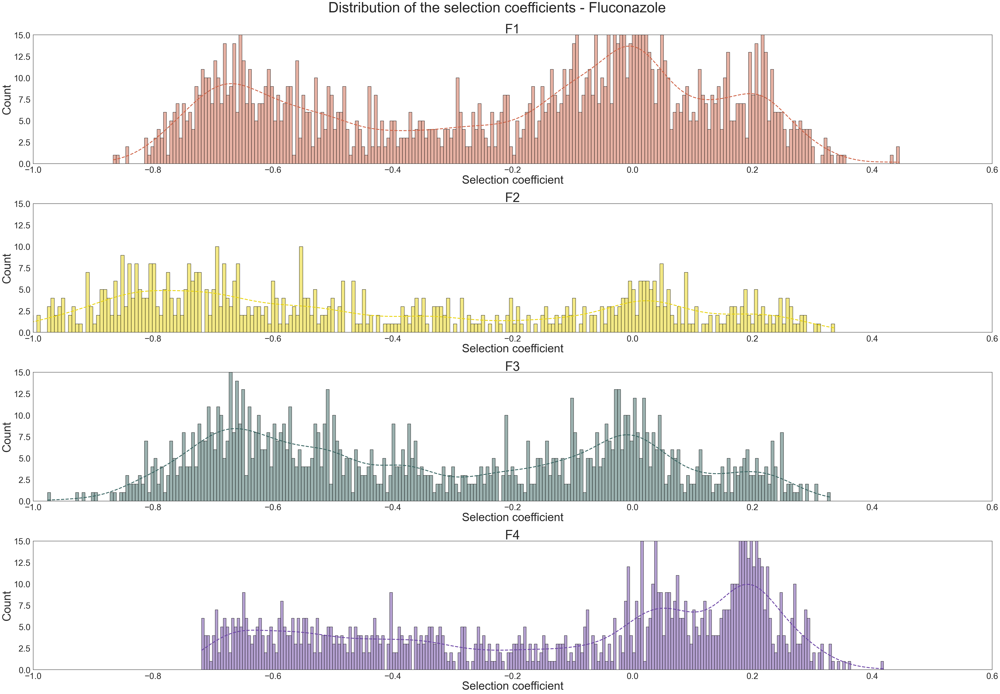

In [57]:
#Distribution of the selection coefficient

df_o_F = df_o.groupby("Fragment")

f_list = ["F1","F2","F3","F4"]
color_list = ["#CF6448","#E9D40D","#386461","#6C44A6"]
row = 0
sns.set_theme(style="white")
fig, axes = plt.subplots(4, 1, figsize=(60,40))
axes = axes.flatten()
 
for frag in f_list :
    
    df = df_o_F.get_group(frag)
    
    sns.set_theme(style="white")
    
    sns.histplot(x=df["select_coef"], edgecolor="black", color = color_list[row],  bins = 250,kde=True, kde_kws = {'bw_adjust': 0.5},ax = axes[row], 
                 line_kws = {'linestyle':'dashed','linewidth':'3'}).lines[0].set_color(color_list[row])

    axes[row].set_ylim(0, 15)
    axes[row].set_xlim(-1, 0.6)
    
    axes[row].set_ylabel("Count",fontsize=40)
    axes[row].set_xlabel("Selection coefficient",fontsize=40)
    
    axes[row].set_title(frag, fontsize=45)
    
    axes[row].tick_params(labelsize = 30)  
    
    row += 1
    
fig.subplots_adjust(hspace=0.31)
fig.suptitle('Distribution of the selection coefficients - ' + condition, y=0.92, fontsize=50)

name = "Distribution_of_the_selection_coefficient_"  + condition + "_" + experiment + "_" + date 
plt.savefig(f"c:{name}.png", format='png', transparent=True, dpi=400)

In [58]:
#put rows in overlaps in a new df

df_new = pd.DataFrame(columns=["index", 'position', 'aa', 'Antifungal', 'Fragment', "l2fc_0_2", "l2fc_0_3", "select_coef", "l2fc_0_2_norm", "l2fc_0_3_norm", "select_coef_norm"])

for _, row in df_o.iterrows():
    position = row['position']
    fragment = row['Fragment']
    
    if position in f3_f4_over and fragment == "F3":
        row['Fragment'] = "F3_4"
        df_new = df_new.append(row, ignore_index=True)
        
    elif position in f2_f3_over and fragment == "F2":
        row['Fragment'] = "F2_3"
        df_new = df_new.append(row, ignore_index=True)
        
    elif position in f2_f3_over and fragment == "F3":
        row['Fragment'] = "F3_2"
        df_new = df_new.append(row, ignore_index=True)
        
    elif position in f1_f2_over and fragment == "F2":
        row['Fragment'] = "F2_1"
        df_new = df_new.append(row, ignore_index=True)
        
    elif position in over_list:
        df_new = df_new.append(row, ignore_index=True)
        
df_new = df_new.reset_index().drop("index",axis=1).drop("level_0",axis=1)

C:\Users\CABED117\AppData\Local\Temp\ipykernel_24244\2685448605.py:26: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\CABED117\AppData\Local\Temp\ipykernel_24244\2685448605.py:23: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\CABED117\AppData\Local\Temp\ipykernel_24244\2685448605.py:15: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\CABED117\AppData\Local\Temp\ipykernel_24244\2685448605.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\CABED117\AppData\Local\Temp\ipykernel_24244\2685448605.py:11: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version

In [59]:
df_group = df_new.groupby(["Fragment"])

f1 = df_group.get_group("F1").reset_index()
f2_1 = df_group.get_group("F2_1").reset_index()
f2_3 = df_group.get_group("F2_3").reset_index()
f3_2 = df_group.get_group("F3_2").reset_index()
f3_4 = df_group.get_group("F3_4").reset_index()
f4 = df_group.get_group("F4").reset_index()

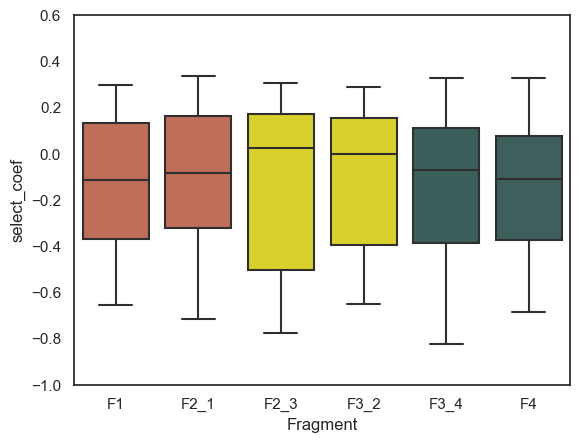

In [60]:
sns.set_theme(style="white")

custom_palette = sns.blend_palette(["#CF6448","#CF6448","#F6EA0E","#F6EA0E","#386461","#386461"], n_colors=6)
sns.boxplot(data= df_new, x= "Fragment", y = "select_coef", palette = custom_palette)
plt.ylim(-1, 0.6)

name = "Boxplot_overlaps_med_select_coef_" + condition + "_" + experiment + "_" + date 
plt.savefig(f"c:{name}.png", format='png', transparent=True, dpi=400)

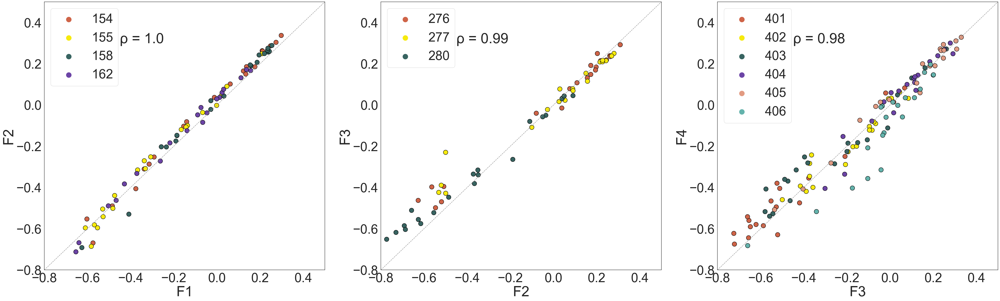

In [61]:
#correlation between overlaps

o1_list = ["f1","f2_3","f3_4"]

o2_list = ["f2_1","f3_2","f4"]

title_name = ["F1 and F2","F2 and F3","F3 and F4"]
x_name = ["F1", "F2", "F3"]
y_name = ["F2", "F3", "F4"]

row = 0
sns.set_theme(style="white")
fig, axes = plt.subplots(1, 3, figsize=(60,17))
axes = axes.flatten()
    
for i in range(len(o1_list)) :
    
    name1 = o1_list[i]
    df1 = globals()[name1]
    
    name2 = o2_list[i]
    df2 = globals()[name2]
    
    sns.set_theme(style="white")
    
    custom_palette = sns.color_palette(["#CF6448","#F6EA0E","#386461","#6C44A6","#E29B82","#64B3AC"], n_colors=len(df1["position"].unique()))
    
    sns.scatterplot(x=df1["select_coef"],  y=df2["select_coef"], legend = True, palette = custom_palette,edgecolor="black",  
                    hue = df1["position"],s = 250, ax = axes[row])    
    
    axes[row].set_ylabel(y_name[i], fontsize=50)
    axes[row].set_xlabel(x_name[i], fontsize=50)
    
    #axes[row].set_title(title_name[i], fontsize=55)
    
    axes[row].set_ylim(-0.8, 0.5)
    axes[row].set_xlim(-0.8, 0.5)
    
    axes[row].tick_params(labelsize = 45)
    
    x_vals = np.array([-0.8, 0.5])
    y_vals = x_vals
    
    result = sp.stats.spearmanr(df1["select_coef"],df2["select_coef"])
    coeff = result[0]
    p_value = result[1]
    R2 = coeff**2 
    
    text = "ρ = " + str(round(coeff, 2)) #+ "\nP = " + str(round(p_value, 5))
    axes[row].text(-0.45,0.3, text , fontsize = 50)

    # Plot the diagonal line
    axes[row].plot(x_vals, y_vals, '--', color="#989898")
    
    # Increase the size of the legend
    axes[row].legend(fontsize=45, markerscale=3)
        
    row +=1
    
fig.subplots_adjust(hspace=0.31)



plt.rcParams['svg.fonttype'] = 'none'
name = "Overlap_select_coef_"  + condition + "_" + experiment + "_" + date 
plt.savefig(f"c:{name}.png", format='png', transparent=True, dpi=300)
plt.savefig(f"c:{name}.svg", format='svg', transparent=True, dpi=300)

In [62]:
#Getting the means of the overlapping positions, needed to do heatmap 

#norm_df = norm_df.drop('Fragment', axis=1)

df_group = df_o.groupby(["position","aa","Antifungal"])
cols = ["select_coef"]
df_mean = df_group[cols].mean()

#reset index so the index becomes columns again
df_mean = df_mean.reset_index(level=["position","aa","Antifungal"])

name = "Select_coeff_mean_overlap_" + condition + "_" + experiment + "_" + date + ".csv"
df_mean.to_csv(name) 

# 7- Heatmaps 

In [63]:
name = "Select_coeff_mean_overlap_" + condition + "_" + experiment + "_" + date + ".csv"
df_f = pd.read_csv(name, header=0, index_col = 0)

In [64]:
WT_annot = pd.read_excel('../wt_aa_annot.xlsx', header=0, index_col = 0)

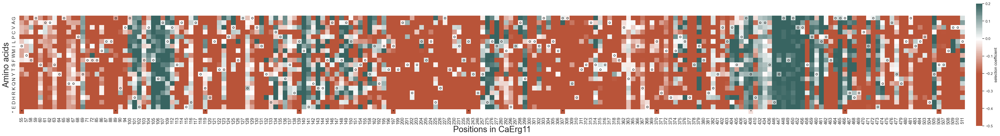

In [65]:
heat = pd.pivot_table(df_f, index="aa", columns= "position", values="select_coef")

heat = heat.reindex(index = ["G","A","V","C","P","L","I","M","W","F","S","T","Y","N","Q","K","R","H","D","E","*"])

custom_palette = sns.blend_palette(["#B95439","#B95439","#B95439","#FFFFFF","#386461"], n_colors=101)

plt.subplots(figsize=(60,60))
sns.set(rc={'figure.facecolor':'white'})
#sns.set(font_scale=1.5)

sns.heatmap(heat, xticklabels="auto", yticklabels=True, annot=False, cmap = custom_palette, 
            robust = True,square=True,  vmin=-0.5, vmax=0.2,center=-0.2, 
            cbar_kws={"shrink": 0.11,"pad": 0.01,'label': 'selection coefficient'})

plt.tick_params(axis='y', labelsize=14)
plt.tick_params(axis='x', labelsize=13)

for i in range(heat.shape[0]):
    for j in range(heat.shape[1]):
        if WT_annot.iloc[i, j] == "o" or WT_annot.iloc[i, j] == "*":
            plt.text(j + 0.5, i + 0.5, WT_annot.iloc[i, j], ha='center', va='center', fontsize=12, color='black')
        
#titre = f"Selection coefficients - {condition} Screening - Library Erg11 of " + '$\it{Candida}$' +" "+ '$\it{albicans}$'

#plt.title(titre, fontsize =30)

plt.xlabel('Positions in CaErg11', fontsize = 25)
plt.ylabel('Amino acids', fontsize = 25)

plt.rcParams['svg.fonttype'] = 'none'
name = "Heatmap_" + "select_coef_" + condition + "_" +experiment + "_" + date + ".png"
plt.savefig(name, transparent=True, dpi=750,format='png', bbox_inches='tight')
name = "Heatmap_" + "select_coef_" + condition + "_" +experiment + "_" + date + ".svg"
plt.savefig(name, transparent=True, dpi=300,format='svg', bbox_inches='tight')

# 8- t-test significant resistance

In [67]:
#import the df with the replicates, replicates are needed for t tests

df_t = pd.read_csv("Select_coeff_log2foldchange_F4_corrected_Fluconazole_NovaSeq_winter2023_albicans_"+ date+ ".csv", header=0)

In [68]:
# Add a new column with the translation
df_t['aa'] = df_t['codon'].map(DNA_Codons)
df_t['DNA_variant'] =df_t['position'].astype(str) + df_t['codon']
df_t['aa_variant'] =df_t['position'].astype(str) + df_t['aa']

In [69]:
Ca_ERG11 = "ATGGCCATTGTTGAAACGGTAATAGATGGAATCAACTATTTTTTATCACTGTCTGTAACTCAACAAATTAGTATATTACTAGGGGTCCCGTTTGTGTACAATCTGGTTTGGCAGTATTTATATAGTCTAAGAAAAGATAGAGCACCCCTGGTATTCTATTGGATACCCTGGTTCGGCTCAGCAGCGTCTTATGGTCAACAACCGTATGAATTTTTTGAGTCATGCAGGCAGAAATATGGCGATGTTTTTTCCTTTATGCTTCTTGGGAAAATAATGACTGTGTACCTTGGCCCAAAGGGTCACGAATTTGTCTTCAATGCGAAGTTAAGCGATGTCTCTGCTGAAGATGCATACAAACACTTAACAACTCCGGTATTCGGAAAGGGAGTTATCTACGATTGTCCCAACAGTCGTCTGATGGAGCAGAAAAAGTTTGCTAAATTCGCGCTTACTACGGACTCATTCAAAAGGTATGTACCCAAAATTCGTGAAGAAATATTAAACTATTTCGTAACAGACGAAAGTTTCAAATTAAAGGAAAAGACACACGGCGTGGCTAACGTGATGAAAACACAACCTGAAATCACCATTTTTACCGCCAGCAGGTCCTTATTTGGCGACGAGATGAGAAGAATTTTCGATAGAAGTTTTGCTCAACTGTACTCAGATTTGGATAAAGGTTTTACTCCGATAAATTTCGTGTTCCCAAACCTTCCTTTGCCACACTATTGGAGAAGAGATGCTGCACAAAAGAAGATAAGTGCGACCTATATGAAAGAGATAAAATCCCGTAGGGAAAGGGGTGACATTGACCCTAACAGAGACTTGATTGATTCTCTGCTGATTCATAGCACATACAAAGACGGTGTGAAGATGACCGACCAGGAGATTGCAAACCTGCTTATAGGTATTTTAATGGGTGGACAGCACACATCAGCTTCTACGTCAGCATGGTTTCTGCTACACCTGGGGGAAAAACCGCACCTACAAGACGTAATATATCAAGAGGTGGTGGAGTTACTAAAAGAGAAAGGAGGCGATCTAAACGATTTAACCTATGAGGATCTGCAAAAATTGCCGTCAGTCAACAACACGATCAAGGAAACGCTAAGGATGCACATGCCTCTACACAGTATATTCAGAAAAGTTACTAACCCACTTAGGATCCCTGAAACCAACTACATCGTCCCAAAAGGACACTACGTTCTTGTCAGCCCAGGCTACGCACACACGAGTGAGAGATACTTTGATAACCCGGAGGATTTTGATCCTACACGTTGGGATACTGCTGCAGCCAAAGCCAATTCTGTAAGCTTTAACTCCAGTGATGAGGTAGATTACGGCTTTGGGAAAGTATCAAAAGGCGTCAGCTCACCATATCTTCCCTTCGGTGGCGGTAGACATAGATGTATAGGTGAACAATTTGCATACGTTCAGCTGGGAACCATATTAACGACGTTTGTTTATAACTTGAGATGGACTATCGACGGGTATAAAGTCCCTGATCCTGACTATAGCTCTATGGTTGTTctaCCCACCGAACCGGCTGAAATAATTTGGGAGAAAAGAGAGACATGTATGTTTTGA"

#Get the codons in the wt seq

wt_dict = {}
pos = 1

for i in range(0, len(Ca_ERG11), 3):
    codon = Ca_ERG11[i:i + 3]
    wt_dict.update({pos : codon})
    pos = pos+1

In [70]:
# get all the wts infos in our df fluco

df_wt = df_t  # Assigning merged_df to df_wt

ite = 0  # Initializing a counter variable

for i in df_wt.iterrows():  # Iterating over the rows of df_wt
    
    first_row = df_wt.loc[ite]  # Accessing the row at index ite
    
    position = first_row['position']  # Extracting the value of 'position' column
    aa_wt = aa_dict[position]  # Getting the corresponding value from wt_dict
    
    if first_row['aa'] != aa_wt:  # Comparing 'codon' value with codon_wt
        
        df_wt = df_wt.drop(ite)  # Dropping the row at index ite
        
    else :   
        df_t.loc[ite,"aa_variant"] = "WT"
        
    ite = ite + 1  # Incrementing the counter variable
    
df_wt = df_wt.drop("level_0",axis=1).reset_index()

In [71]:
df_t

,Unnamed: 0,level_0,index,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,nbr_tp0,nbr_tp2,OD_tp0,OD_tp2,l2fc_0_2,aa,select_coef,nbr_gen,DNA_variant,aa_variant
0,0,0,0,55,AAA,Fluco,F1,1,0.000129,0.000011,728.0,58.0,8.15,8.392317,-3.613026,K,-0.387945,8.392317,55AAA,55K
1,1,1,3,55,AAC,Fluco,F1,1,0.000115,0.000008,653.0,44.0,8.15,8.392317,-3.847188,N,-0.415847,8.392317,55AAC,55N
2,2,2,6,55,AAG,Fluco,F1,1,0.000156,0.000003,885.0,18.0,8.15,8.392317,-5.529130,K,-0.616262,8.392317,55AAG,55K
3,3,3,9,55,AAT,Fluco,F1,1,0.000097,0.000004,548.0,23.0,8.15,8.392317,-4.501594,N,-0.493824,8.392317,55AAT,55N
4,4,4,12,55,ACC,Fluco,F1,1,0.000081,0.000047,460.0,260.0,8.15,8.392317,-0.806611,T,-0.053542,8.392317,55ACC,55T
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23971,5935,1975,23963,511,TGT,Fluco,F4,3,0.000230,0.000080,960.0,277.0,0.00,7.798862,-1.523444,C,0.013148,7.798862,511TGT,511C
23972,5936,1976,23966,511,TTA,Fluco,F4,3,0.000165,0.000048,688.0,167.0,0.00,7.798862,-1.770036,L,-0.014421,7.798862,511TTA,WT
23973,5937,1977,23969,511,TTC,Fluco,F4,3,0.000138,0.000408,574.0,1416.0,0.00,7.798862,1.567213,F,0.217522,7.798862,511TTC,511F
23974,5938,1978,23972,511,TTG,Fluco,F4,3,0.000182,0.000068,758.0,236.0,0.00,7.798862,-1.413206,L,0.024523,7.798862,511TTG,WT


In [72]:
# Perform t-tests for each variant
variants = df_t['aa_variant'].unique()
results = []

for variant in variants:
    variant_data = df_t[df_t['aa_variant'] == variant]

    anti_data = variant_data[variant_data['Antifungal'] == cond]['select_coef']
    wt_data = df_t[df_t['aa_variant'] == 'WT']['select_coef']
    t_stat, p_value = ttest_ind(anti_data, wt_data)
    
    results.append((variant, p_value))

# Apply FDR correction to the p-values decause I am doing multiple comparaison
_, adjusted_p_values, _, _ = multipletests([p_value for _, p_value in results], method='fdr_bh')

# Create a DataFrame to store the results
results_df = pd.DataFrame(results, columns=['aa_variant', 'p_value'])
results_df['adjusted_p_value'] = adjusted_p_values

# View the results
print(results_df)

     aa_variant        p_value  adjusted_p_value
0           55K  3.163277e-170     1.028736e-169
1           55N  5.013598e-133     1.305717e-132
2           55T   1.616636e-10      2.006263e-10
3           55R  1.859256e-212     9.434185e-212
4            WT   1.000000e+00      1.000000e+00
...         ...            ...               ...
3826       511Y  1.487172e-177     5.155977e-177
3827       511S   6.109082e-05      7.026086e-05
3828       511C   1.495881e-02      1.622055e-02
3829       511W   1.619999e-06      1.904332e-06
3830       511F   2.406962e-44      4.146165e-44

[3831 rows x 3 columns]


In [73]:
# Merge the variant results 
anti_merged = df_t.merge(results_df, on=['aa_variant'], how='left')

In [74]:
anti_merged

,Unnamed: 0,level_0,index,position,codon,Antifungal,Fragment,Replicate,freq_tp0,freq_tp2,...,OD_tp0,OD_tp2,l2fc_0_2,aa,select_coef,nbr_gen,DNA_variant,aa_variant,p_value,adjusted_p_value
0,0,0,0,55,AAA,Fluco,F1,1,0.000129,0.000011,...,8.15,8.392317,-3.613026,K,-0.387945,8.392317,55AAA,55K,3.163277e-170,1.028736e-169
1,1,1,3,55,AAC,Fluco,F1,1,0.000115,0.000008,...,8.15,8.392317,-3.847188,N,-0.415847,8.392317,55AAC,55N,5.013598e-133,1.305717e-132
2,2,2,6,55,AAG,Fluco,F1,1,0.000156,0.000003,...,8.15,8.392317,-5.529130,K,-0.616262,8.392317,55AAG,55K,3.163277e-170,1.028736e-169
3,3,3,9,55,AAT,Fluco,F1,1,0.000097,0.000004,...,8.15,8.392317,-4.501594,N,-0.493824,8.392317,55AAT,55N,5.013598e-133,1.305717e-132
4,4,4,12,55,ACC,Fluco,F1,1,0.000081,0.000047,...,8.15,8.392317,-0.806611,T,-0.053542,8.392317,55ACC,55T,1.616636e-10,2.006263e-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23971,5935,1975,23963,511,TGT,Fluco,F4,3,0.000230,0.000080,...,0.00,7.798862,-1.523444,C,0.013148,7.798862,511TGT,511C,1.495881e-02,1.622055e-02
23972,5936,1976,23966,511,TTA,Fluco,F4,3,0.000165,0.000048,...,0.00,7.798862,-1.770036,L,-0.014421,7.798862,511TTA,WT,1.000000e+00,1.000000e+00
23973,5937,1977,23969,511,TTC,Fluco,F4,3,0.000138,0.000408,...,0.00,7.798862,1.567213,F,0.217522,7.798862,511TTC,511F,2.406962e-44,4.146165e-44
23974,5938,1978,23972,511,TTG,Fluco,F4,3,0.000182,0.000068,...,0.00,7.798862,-1.413206,L,0.024523,7.798862,511TTG,WT,1.000000e+00,1.000000e+00


In [75]:
df_group = anti_merged.groupby(["position","Antifungal","aa"])
cols = ["select_coef","p_value","adjusted_p_value"]
med_anti = df_group[cols].median()

#reset index so the index becomes columns again
med_anti = med_anti.reset_index(level=["position","Antifungal","aa"])
med_anti['aa_variant'] =med_anti['position'].astype(str) + med_anti['aa']

In [76]:
advantageous = []
wt_like = []
deleterious = []
df_del = pd.DataFrame(columns=['select_coef', 'aa_variant', 'result'])

for i in range(len(med_anti)):
    if med_anti.loc[i,"adjusted_p_value"] < 0.01 and med_anti.loc[i,"select_coef"] > 0:
        advantageous.append(med_anti.loc[i, "aa_variant"])
        df_del.loc[i,"select_coef"] = med_anti.loc[i,"select_coef"]
        df_del.loc[i,"aa_variant"] = med_anti.loc[i,"aa_variant"]
        df_del.loc[i,"result"] = "Advantageous"
    elif med_anti.loc[i,"adjusted_p_value"] > 0.01 :
        wt_like.append(med_anti.loc[i, "aa_variant"])
        df_del.loc[i,"select_coef"] = med_anti.loc[i,"select_coef"]
        df_del.loc[i,"aa_variant"] = med_anti.loc[i,"aa_variant"]
        df_del.loc[i,"result"] = "WT like"
    elif med_anti.loc[i,"adjusted_p_value"] < 0.01 and med_anti.loc[i,"select_coef"] < 0:
        deleterious.append(med_anti.loc[i, "aa_variant"])
        df_del.loc[i,"select_coef"] = med_anti.loc[i,"select_coef"]
        df_del.loc[i,"aa_variant"] = med_anti.loc[i,"aa_variant"]
        df_del.loc[i,"result"] = "Deleterious"

In [77]:
print(str(len(advantageous)) + " variant have an advantage")
print(str(len(deleterious)) + " variant have a deleterious substitution")
print(str(len(wt_like)) + " variant are like the WT")

946 variant have an advantage
2561 variant have a deleterious substitution
515 variant are like the WT


In [78]:
df_del_g = df_del.groupby("result")
df_del_wt = df_del_g.get_group("WT like")
#df_del_wt["select_coef"].max()
#df_del_wt["select_coef"].min()
df_del_wt["select_coef"].quantile(0.95)
#df_del_wt["select_coef"].quantile(0.05)

0.04858917122057969

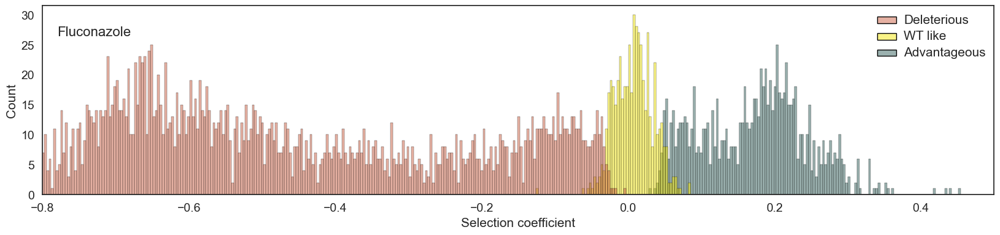

In [79]:
sns.set_style("white")
sns.set_theme(style="white", palette=None)

plt.subplots(figsize=(20, 4))
custom_palette = sns.blend_palette(["#CF6448", "#F6EA0E", "#386461"], n_colors=3)

plot = sns.histplot(data=df_del, x="select_coef", edgecolor="black", hue="result", palette=custom_palette, bins=500)

legend = plot.get_legend()  
legend.set_title("", prop={"size": 16} ) 
legend.set_frame_on(False)
for label in legend.get_texts():  
    label.set_size(15)  
    
plt.xlim(-0.8, 0.5)
#plt.title(condition + " - distribution of the selection coefficient", fontsize=20)

plt.tick_params(axis='y', labelsize=14)
plt.tick_params(axis='x', labelsize=14)

plt.xlabel('Selection coefficient', fontsize = 15)
plt.ylabel('Count', fontsize = 15)

plt.text(-0.78,26.5, condition , fontsize = 16)
    
plt.rcParams['svg.fonttype'] = 'none'
name = "Distribution_" + "select_coef_t-test_results_" + condition + "_" +experiment + "_" + date 
plt.savefig(name+ ".png", transparent=True, dpi=750,format='png', bbox_inches='tight')
plt.savefig(name+ ".svg", transparent=True, dpi=750,format='svg', bbox_inches='tight')

In [80]:
#med_anti = med_anti.drop(["level_0","index"], axis=1)
med_anti = med_anti.rename(columns={"aa_variant": "variant"})
name = "Select_coeff_p_value_aa_" + condition + "_" + experiment + "_" + date + ".csv"
med_anti.to_csv(name) 

med_anti

,position,Antifungal,aa,select_coef,p_value,adjusted_p_value,variant
0,55,Fluco,*,-0.635982,5.012793e-142,1.362953e-141,55*
1,55,Fluco,A,-0.103453,6.442903e-15,8.395497e-15,55A
2,55,Fluco,C,-0.080846,7.870896e-09,9.566434e-09,55C
3,55,Fluco,D,-0.706814,3.575718e-229,2.619230e-228,55D
4,55,Fluco,E,-0.610011,1.812810e-207,8.573922e-207,55E
...,...,...,...,...,...,...,...
4017,511,Fluco,S,0.070603,6.109082e-05,7.026086e-05,511S
4018,511,Fluco,T,-0.178867,8.149225e-34,1.270642e-33,511T
4019,511,Fluco,V,-0.016039,1.919017e-01,2.006483e-01,511V
4020,511,Fluco,W,-0.092103,1.619999e-06,1.904332e-06,511W
